# <span style='font-family:"Times New Roman"'> <span styel=''> **GROUP EXPLORATION**

*Emile Cohen* 
    
*March 2020*

**Goal:** In this notebook, we create subgroups of the cohort, based on their Copy Number State and their mutational profile. For that we create functions to visualize vaf, ccf, purity, 'Expected Number of copies of TP53 mutations' densities but also scatterplots of VAF1/VAF2, CCF1/CCF2 and VAF/CF.
    
The Notebook is divided in 2 parts:
   
* **1. Function Definition**
* **2. Loading Master**
* **3. Group Creation**
* **4. Data Exploration**
* **5. Final Subgroups Analysis**

**NB1:** In each part, you must run the cells from the begining in order to initialize the variables

**NB2:** All functions used for the plots are located in utils/custom_tools.py

---

In [2]:
%run -i '../../utils/setup_environment.ipy'
from utils.analysis_tools import *

import warnings, math
warnings.filterwarnings('ignore')
import ptitprince as pt
import IPython.display

data_path = '../../data/'

Setup environment... done!


<span style="color:green">✅ Working on **mskimpact_env** conda environment.</span>

In [53]:
def load_clean_up_master(path):
    master = pd.read_pickle(path)
    # We eliminate unmatched samples
    master = master[master['Somatic_Status']!='Unmatched']
    #We eliminate samples with too low purity
    samples_cutoff = list(master[master['purity'] > 0.20]['Tumor_Id'])
    samples_na = list(master[master['purity'].isna()]['Tumor_Id'])
    samples_cutoff = samples_cutoff + samples_na
    master_cutoff = master[master.Tumor_Id.isin(samples_cutoff)]
    master_cutoff.drop( master_cutoff[master_cutoff['tp53_group'] == '1_WILD_TYPE'][master_cutoff['purity'] <= 0.31].index , inplace=True)
    # we clean the 1_WILD_TYPE subgroup
    master_cutoff.drop(master_cutoff[master_cutoff['tp53_group']=='1_WILD_TYPE'][master_cutoff['tp53_cn_state']=='DIPLOID'][master_cutoff['tp53_vaf_1']>0.6].index, inplace=True)
    master_cutoff.drop(master_cutoff[master_cutoff['tp53_group']=='1_WILD_TYPE'][master_cutoff['tp53_residual_1']<0.5].index, inplace=True)
    
    return master_cutoff

In [54]:
master = pd.read_pickle(data_path + 'merged_data/master_file.pkl')
display(get_groupby(master, 'tp53_group', 'count').sort_values(by=['count'], ascending=False))

master_cleaned = load_clean_up_master(data_path + 'merged_data/master_file.pkl')
display(get_groupby(master_cleaned, 'tp53_group', 'count').sort_values(by=['count'], ascending=False))

,count
tp53_group,
>=1_cnLOH,5114
>=1_LOSS,4000
0_HETLOSS,2751
1_WILD_TYPE,1734
>1muts,753
HOMDEL,281


,count
tp53_group,
>=1_cnLOH,4970
>=1_LOSS,3906
0_HETLOSS,2678
1_WILD_TYPE,769
>1muts,708
HOMDEL,272


In [38]:
get_groupby(master[master['purity'].isna()],'tp53_group','count')

,count
tp53_group,
1_WILD_TYPE,189
>1muts,40
>=1_LOSS,11
>=1_cnLOH,3
HOMDEL,4


---
## Function Definition

In this part we define the needed functions to plot summaries of each subgroup.

---

The following *f1, f2* and *f3* allow to recompute the ccf (cancer cell fraction), based on Teng repository Github (https://github.com/papaemmelab/driverclone/blob/master/utils.r#L124-L175)

In [3]:
def f1(x):
    if math.isnan(x.tp53_exp_nb_1):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_1 >= 1 :
            m_star = round(x.tp53_exp_nb_1)
        else : m_star = 1
        return (x.tp53_exp_nb_1/m_star)
    
def f2(x):
    if math.isnan(x.tp53_exp_nb_2):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_2 >= 1 :
            m_star = round(x.tp53_exp_nb_2)
        else : m_star = 1
        return (x.tp53_exp_nb_2/m_star)
    
def f3(x):
    if math.isnan(x.tp53_exp_nb_3):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_3 >= 1 :
            m_star = round(x.tp53_exp_nb_3)
        else : m_star = 1
        return (x.tp53_exp_nb_3/m_star)

---
We define 4 functions that will allow us to print easily the summary report of our subgroups.

1. plot_ccf_vaf
2. plot_scatters
3. plot_purity_numbers
4. plot_copies_tcn

In [4]:
def plot_ccf_vaf(data, group_name):
    
    data_vaf = list(data['tp53_vaf_1']) + list(data['tp53_vaf_2']) + list(data['tp53_vaf_3'])
    data_ccf = list(data['tp53_ccf_1']) + list(data['tp53_ccf_2']) + list(data['tp53_ccf_3'])
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3), sharex=True)
    
    sns.distplot(data_vaf, kde_kws={'clip': (0.0, 1.0), "shade": True}, hist=False, ax=ax1)
    ax1.set_ylabel('Density Estimation')
    ax1.set_xlabel('VAF of TP53 mutations')
    ax1.set_title('VAF Distribution' , weight = 'bold')

    sns.distplot(data_ccf,kde_kws={"shade": True}, hist=False, ax=ax2)
    ax2.set_xlabel('CCF of TP53 mutations')
    ax2.set_title('CCF Distribution', weight = 'bold')
    
    plt.show()

    
    
def plot_scatters(data, txt, group):
    
    data_vaf = data[['tp53_vaf_1', 'tp53_vaf_2', 'tp53_vaf_3']]
    max_table_vaf = pd.DataFrame(np.sort(data_vaf.fillna(0).values)[:,-2:], columns=['2nd-largest','largest'])
    max_table_vaf = pd.concat([max_table_vaf, data.reset_index().tp53_cn_state], axis=1)
    
    data_ccf = data[['tp53_ccf_1', 'tp53_ccf_2', 'tp53_ccf_3']]
    max_table_ccf = pd.DataFrame(np.sort(data_ccf.fillna(0).values)[:,-2:], columns=['2nd-largest','largest'])
    max_table_ccf = pd.concat([max_table_ccf, data.reset_index().tp53_cn_state], axis=1)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharex=True)
    
    sns.scatterplot(x='largest', y='2nd-largest', data=max_table_vaf, hue='tp53_cn_state',hue_order=group, ax=ax1, palette="muted")
    ax1.plot([0,1], [0,1], linewidth=0.5, color='grey')
    ax1.set_ylabel('VAF_2')
    ax1.set_xlabel('VAF_1')
    ax1.set_title('VAF' + txt, weight = 'bold')
    
    sns.scatterplot(x='largest', y='2nd-largest', data=max_table_ccf, hue='tp53_cn_state',hue_order=group, ax=ax2, palette="muted")
    ax2.plot([0,1], [0,1], linewidth=0.5, color='grey')
    ax2.set_ylabel('CCF_2')
    ax2.set_xlabel('CCF_1')
    ax2.set_title('CCF' + txt, weight = 'bold')
    
    plt.show()

def plot_purity_cancer(data, group, group_name, mut_cn_group=False): 
        f, axs = plt.subplots(1, 2, figsize=(14, 4))
        f.suptitle(group_name+' SUMMARY', fontsize=16, weight = 'bold')
        ax1 = axs[0]
        sns.distplot(data['purity'], hist=False,kde_kws={'clip': (0.0, 1.0), "shade": True}, ax=ax1)
        ax1.set_xlim([0,1])
        ax1.set_xlabel('Purity')
        ax1.set_ylabel('Density Estimation')
        ax1.set_title('Purity', weight = 'bold')

        ax2 = axs[1]
        data_cancer = pd.DataFrame(get_groupby(data, 'Cancer_Type', 'count')).sort_values(by=['count'], ascending=False).head(10)
        sns.barplot(y='count', x=data_cancer.index, data=data_cancer, ax=ax2, color=plt.cm.Blues(0.4))
        ax2.set_xlabel('Cancer Types')
        ax2.set_ylabel('# of Samples')
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
        ax2.set_title('Cancer Type Distribution', weight = 'bold')

def plot_copies_tcn(data, group, group_name, nb_muts):
    data = filter_muts(data, nb_muts)
    data_1 =  pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_1']])
    data_1.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_2 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_2']])
    data_2.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_3 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_3']])
    data_3.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_4 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_4']])
    data_4.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_5 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_5']])
    data_5.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_tot = data_1.append(data_2)
    data_tot = data_tot.append(data_3)
    data_tot = data_tot.append(data_4)
    data_tot = data_tot.append(data_5)
    
    data_tot = pd.merge(left=data_tot, right=data[['Tumor_Id','tp53_cn_state', 'tp53_tcn']],how='left', left_on='Tumor_Id',right_on='Tumor_Id')

    dx="tp53_tcn"; dy="tp53_exp_nb"; ort="h"; pal = "muted"; sigma = .2; dhue = "tp53_cn_state"; dhue_order=group
    f, ax = plt.subplots(figsize=(15, 10))
    
    # Little trick for indeterminate group
    if group_name == 'INDETERMINATE':
        ax=pt.RainCloud(x = dx, y = dy, data = data_tot, palette = pal, bw = sigma,
                 width_viol = .6, ax = ax, orient = ort, alpha=.6, mv=.2)
    else:
        ax=pt.RainCloud(x = dx, y = dy, data = data_tot, palette = pal, bw = sigma, hue=dhue, hue_order=dhue_order,
                 width_viol = .6, ax = ax, orient = ort, alpha=.6, mv=.2)
    ax.set_ylabel('Total Copy Number')
    ax.set_xlabel('Expected number of copies of Tp53 mutations')
    ax.set_title(group_name, weight = 'bold')

Finally, we define *plot_summary* that uses the functions above to compute a visual summary of the group

In [5]:
def plot_summary(group: list, group_name: str, nb_muts_density=[1,2,3], nb_muts_scatter=[2,3], mut_cn_group=False, sample_type=False):
    
    sns.set_style("whitegrid", {'grid.color': '1'})
    sns.despine(top=True, right=True, left=False, bottom=False)
    
    master_cutoff = master[master['purity'] > 0.25]
    master_cutoff.drop( master_cutoff[master_cutoff['tp53_group'] == '1_WILD_TYPE'][master_cutoff['purity'] <= 0.32].index , inplace=True)
    
    # DENSITY PLOTS
    master_density = filter_muts(master_cutoff, nb_muts_density)
    
    # Plot Purity distribution and cancer distribution
    plot_purity_cancer(master_density, group, group_name, mut_cn_group)
    
    # Plot vaf and ccf densities
    if mut_cn_group:
        master_density = filter_general(master_density, 'tp53_group', group)
        #display(master_density)
    else: master_density = filter_cn_state(master_density, group)

    sns.set_palette("muted", len(set(master_density.tp53_cn_state)),1)
    
    display_side_by_side(get_groupby(master_density, 'tp53_cn_state', 'count'),get_groupby(master_density, 'Cancer_Type', 'count').sort_values(by=['count'], ascending=False).head(15),get_groupby(master_density, 'tp53_count', 'count'))
    plot_ccf_vaf(master_density, group_name)
    
    # SCATTER PLOTS
    if nb_muts_scatter != 0:
        master_scatter = filter_muts(master_cutoff, nb_muts_scatter)
        if mut_cn_group:
            master_scatter = filter_general(master_scatter, 'tp53_group', group)
            group = list(set(master_scatter.tp53_cn_state))
        else: 
            master_scatter = filter_cn_state(master_scatter, group)
        
        plot_scatters(master_scatter, '', group)
        
        # Metastasis VS Primary
        if sample_type:
            master_scatter_prim = master_scatter[master_scatter['Sample_Type'] == 'Primary']
            master_scatter_met = master_scatter[master_scatter['Sample_Type'] == 'Metastasis']
            plot_scatters(master_scatter_prim, ' - Primary Samples', group)
            plot_scatters(master_scatter_met, ' - Metastatic Samples', group)
    
    
    # Plot number of mut copies VS tcn 
    cn_state_group = list(set(master_density.tp53_cn_state))
    plot_copies_tcn(master_density, cn_state_group, group_name, [1,2,3,4,5])

---
## Loading Master

We load the master file and create 3 new columns: for each mutation we compute a Cancer Cell Fraction (CCF), from the Lab Github. This CCF is uncapped and go above 1, contrary to the one given in the Facets output.

In [6]:
# LOADING THE MASTER FILE
master = pd.read_pickle(data_path + 'merged_data/master_file.pkl')

master['tp53_ccf_comp_1'] = master.apply(f1, axis = 1)
master['tp53_ccf_comp_2'] = master.apply(f2, axis = 1)
master['tp53_ccf_comp_3'] = master.apply(f3, axis = 1)

master.head()

,Sample_Id,Tumor_Id,Patient_Id,Cancer_Type,Cancer_Type_Detailed,Sample_Type,purity,ploidy,samples_per_patient,Overall Survival Status,Overall Survival (Months),MSI Score,TMB_Score,Patient_Current_Age,Sex,Ethnicity_Category,Race_Category,mutationStatus,Somatic_Status,tp53_key_1,tp53_vc_1,tp53_ccf_1,tp53_vaf_1,tp53_HGVSp_1,tp53_spot_1,tp53_key_2,tp53_vc_2,tp53_ccf_2,tp53_vaf_2,tp53_HGVSp_2,tp53_spot_2,tp53_key_3,tp53_vc_3,tp53_ccf_3,tp53_vaf_3,tp53_HGVSp_3,tp53_spot_3,tp53_key_4,tp53_vc_4,tp53_ccf_4,tp53_vaf_4,tp53_HGVSp_4,tp53_spot_4,tp53_key_5,tp53_vc_5,tp53_ccf_5,tp53_vaf_5,tp53_HGVSp_5,tp53_spot_5,tp53_count,tp53_tcn,tp53_mcn,tp53_lcn,tp53_seg_length,tp53_cn_state,tp53_cf,wgd,mutation_count,gene_count,driver_count,max_vaf,tp53_exp_nb_1,tp53_exp_nb_2,tp53_exp_nb_3,tp53_exp_nb_4,tp53_exp_nb_5,tp53_residual_1,tp53_residual_2,tp53_residual_3,tp53_residual_4,tp53_residual_5,tp53_first_group,tp53_group,tp53_res_group,chr_affected,chr_loss,chr_gain,chr_cnloh,frac_genome_altered,tp53_vc_group_1,tp53_vc_group_2,tp53_vc_group_3,tp53_vc_group_4,tp53_vc_group_5,tp53_ccf_comp_1,tp53_ccf_comp_2,tp53_ccf_comp_3
0,P-0034223-T01-IM6_P-0034223-N01-IM6,P-0034223-T01-IM6,P-0034223,Breast Cancer,Invasive Breast Carcinoma,Metastasis,0.941111,2.241830,1.0,LIVING,NaN,0.55,5.3,63.0,Female,NaN,NO VALUE ENTERED,SOMATIC,Matched,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,1.0,1.0,80668592.0,DIPLOID,1.000000,-1.0,6,6.0,0,0.901899,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,None,3,2,2,0,0.08,None,None,None,None,None,NaN,NaN,NaN
1,P-0009819-T01-IM5_P-0009819-N01-IM5,P-0009819-T01-IM5,P-0009819,Prostate Cancer,Prostate Adenocarcinoma,Primary,0.275237,2.681075,1.0,LIVING,23.441,0.00,1.0,72.0,Male,Non-Spanish; Non-Hispanic,NO VALUE ENTERED,SOMATIC,Matched,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,1.0,1.0,80668300.0,DIPLOID,1.000000,-1.0,1,1.0,0,0.148014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,None,4,4,0,0,0.137,None,None,None,None,None,NaN,NaN,NaN
2,P-0025956-T01-IM6_P-0025956-N01-IM6,P-0025956-T01-IM6,P-0025956,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,Primary,0.185874,3.496971,1.0,DECEASED,3.584,0.00,5.3,71.0,Female,Non-Spanish; Non-Hispanic,WHITE,SOMATIC,Matched,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,3.0,2.0,1.0,80668431.0,LOSS AFTER,0.169170,1.0,6,6.0,0,0.200000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,None,13,13,1,1,0.624,None,None,None,None,None,NaN,NaN,NaN
3,P-0027408-T01-IM6_P-0027408-N01-IM6,P-0027408-T01-IM6,P-0027408,Non-Small Cell Lung Cancer,Non-Small Cell Lung Cancer,Metastasis,0.308886,1.811066,1.0,LIVING,22.586,0.27,17.6,67.0,Female,Non-Spanish; Non-Hispanic,WHITE,SOMATIC,Matched,P-0027408-T01-IM617_7578409_CT_TC,Missense_Mutation,0.925,0.168901,p.Arg174Glu,174,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,1,1.0,1.0,0.0,26256025.0,HETLOSS,0.275073,-1.0,20,18.0,0,0.192475,0.924711,NaN,NaN,NaN,NaN,0.075289,NaN,NaN,NaN,NaN,LOSS,>=1_LOSS,no_tp53_res,12,11,3,0,0.444,missense,None,None,None,None,0.924711,NaN,NaN
4,P-0006554-T01-IM5_P-0006554-N01-IM5,P-0006554-T01-IM5,P-0006554,Glioma,Anaplastic Oligodendroglioma,Primary,0.715208,1.910719,1.0,LIVING,26.170,1.30,46.2,55.0,Female,Non-Spanish; Non-Hispanic,WHITE,SOMATIC,Matched,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,1.0,1.0,40254480.0,DIPLOID,1.000000,-1.0,47,39.0,0,0.706897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,None,5,4,1,0,0.173,None,None,None,None,None,NaN,NaN,NaN


---
## Group Creation

We defined these two sets of cn_state groups earlier in the work, when we wanted to discover the data. The last one is in **Data Exploration** part, with the summary plots associated.

In [7]:
# Groups definition
WT_present = ['DIPLOID', 'TETRAPLOID', 'LOSS AFTER', 'DOUBLE LOSS AFTER']
loh = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH AFTER', 'CNLOH BEFORE', 'CNLOH & GAIN', 'CNLOH BEFORE & GAIN', 'AMP (LOH)']
loss_withorwithout_WT = ['HETLOSS', 'LOSS BEFORE', 'HOMDEL', 'LOSS BEFORE & AFTER']
gain = ['GAIN', 'AMP', 'AMP (BALANCED)', 'LOSS & GAIN']

In [8]:
# Groups definition
CNLOH = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH AFTER', 'CNLOH BEFORE', 'CNLOH & GAIN', 'CNLOH BEFORE & GAIN', 'AMP (LOH)']
LOSS = ['HETLOSS', 'LOSS BEFORE', 'LOSS AFTER', 'HOMDEL', 'LOSS BEFORE & AFTER', 'DOUBLE LOSS AFTER']
GAIN = ['GAIN', 'AMP', 'AMP (BALANCED)', 'LOSS & GAIN']
DI_TETRA = ['DIPLOID', 'TETRAPLOID']
indeterminate = ['INDETERMINATE', '']
total = CNLOH + LOSS + GAIN + DI_TETRA

,count
tp53_cn_state,
AMP,11
AMP (BALANCED),7
GAIN,92
LOSS & GAIN,9
,count
Cancer_Type,
Non-Small Cell Lung Cancer,23
Glioma,14
Bladder Cancer,9


<Figure size 600x600 with 0 Axes>

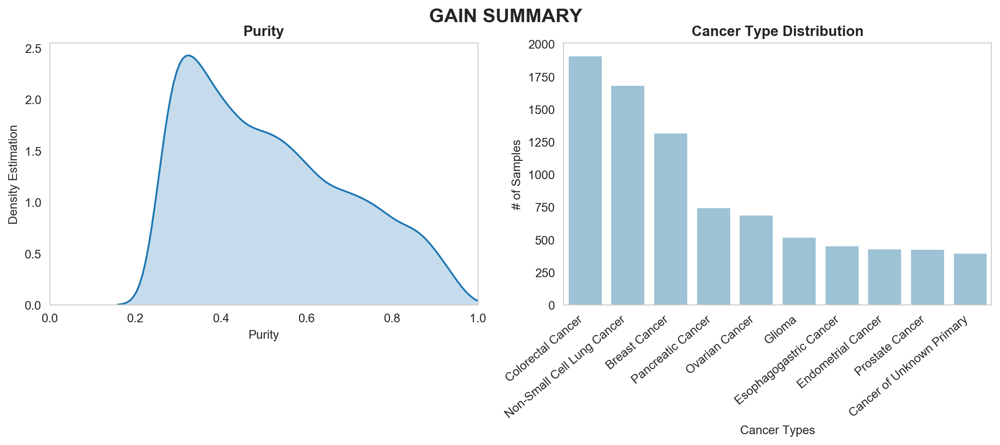

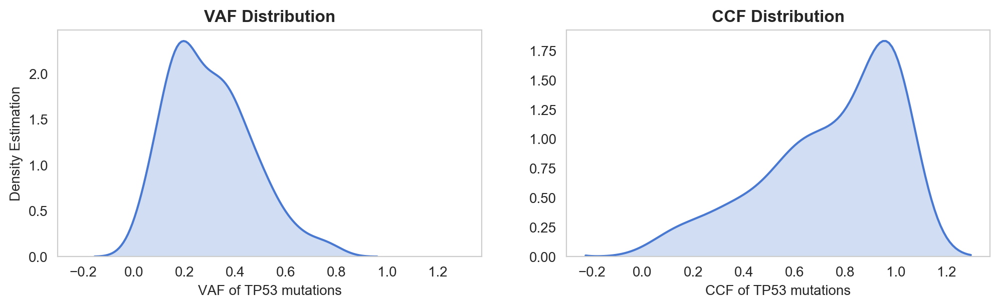

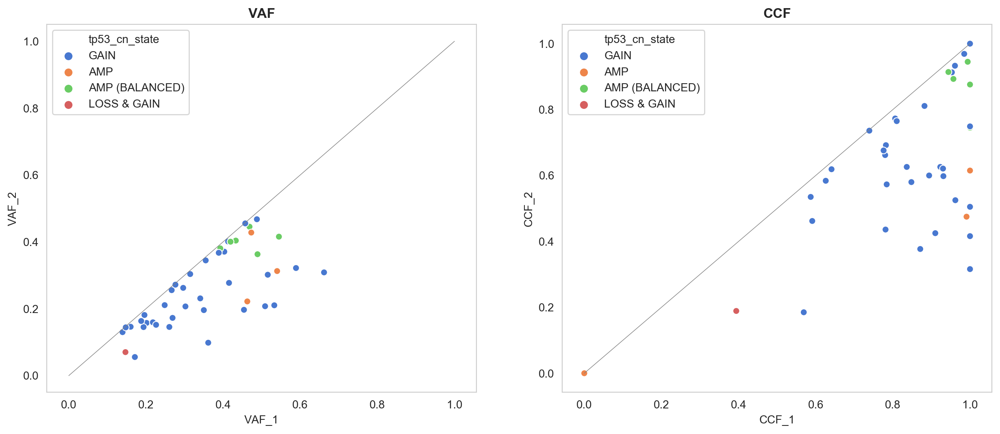

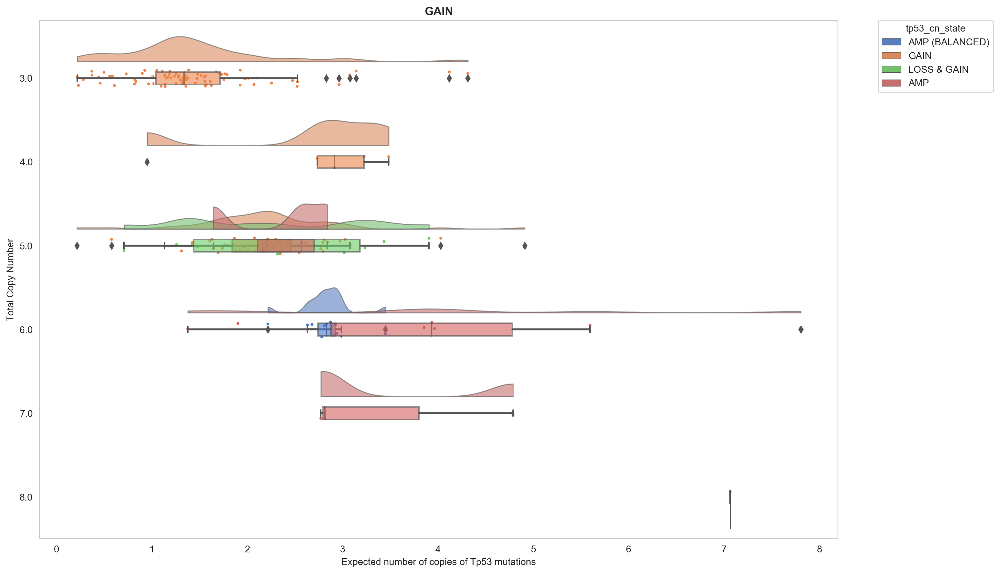

In [9]:
plot_summary(GAIN,'GAIN')

---
## Data Exploration

Skip This Part to see directly the final subgroups.

Here we have the exploratory groups that we defined previously and allowed us to define the final subgroups.
Each plot is done with the following parameters:
* *nb_muts_density* = [1,2,3] is the number of tp53 mutations we selected to plot the densities (vaf, ccf, purity)
* *nb_muts_scatter* = [2,3] is the number of tp53 mutations we selected to plot the scatters (VAF1/VAF2 and CCF1/CCF2)
* For the plot of expected number of tp53 mutations copies, we selected only 1 mutation samples

In [10]:
# Group Definition
WT_allele = ['LOSS AFTER', 'DIPLOID', 'TETRAPLOID']
LOSS_noWT = ['LOSS BEFORE', 'HETLOSS', 'LOSS BEFORE & AFTER']
LOH_noWT = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH BEFORE', 'CNLOH BEFORE & GAIN']
GAIN_WT = ['AMP', 'GAIN','LOSS & GAIN']
AMBIGUOUS = ['CNLOH AFTER', 'DOUBLE LOSS AFTER']
MISSING = ['HOMDEL', 'AMP (BALANCED)', 'AMP (LOH)']
indeterminate = ['INDETERMINATE', '']

,count
tp53_cn_state,
DIPLOID,906
LOSS AFTER,171
TETRAPLOID,65
,count
Cancer_Type,
Colorectal Cancer,180
Glioma,175
Non-Small Cell Lung Cancer,144
Bladder Cancer,74


<Figure size 600x600 with 0 Axes>

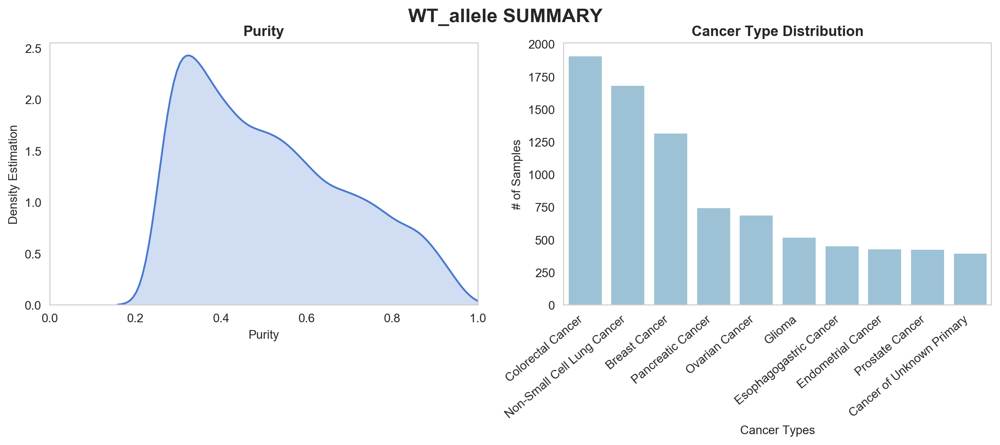

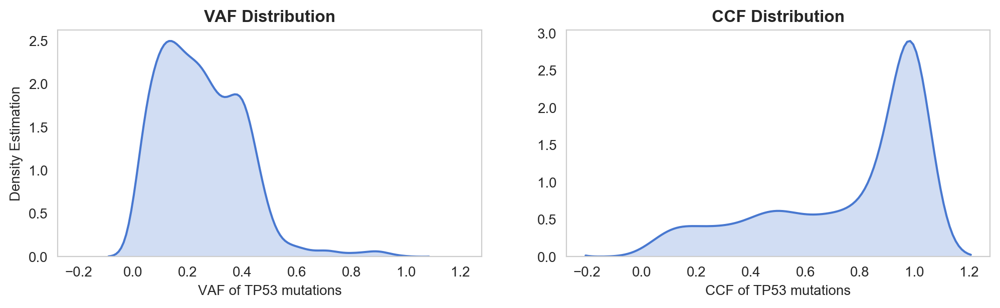

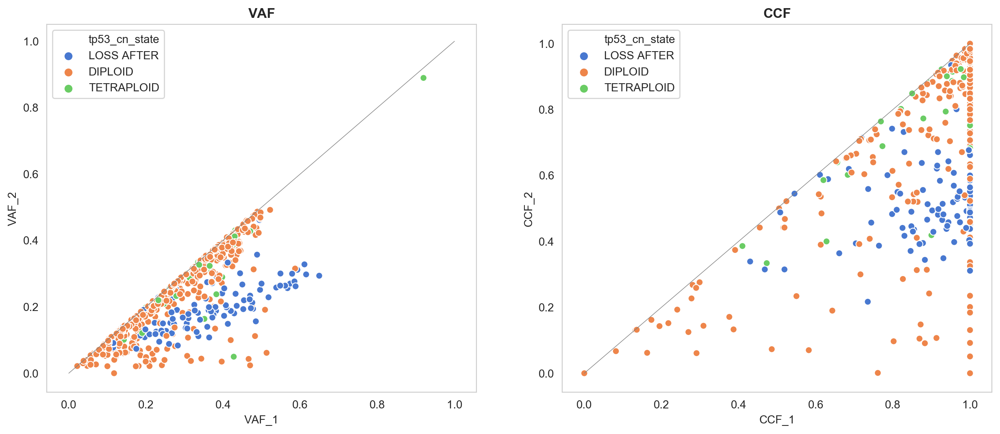

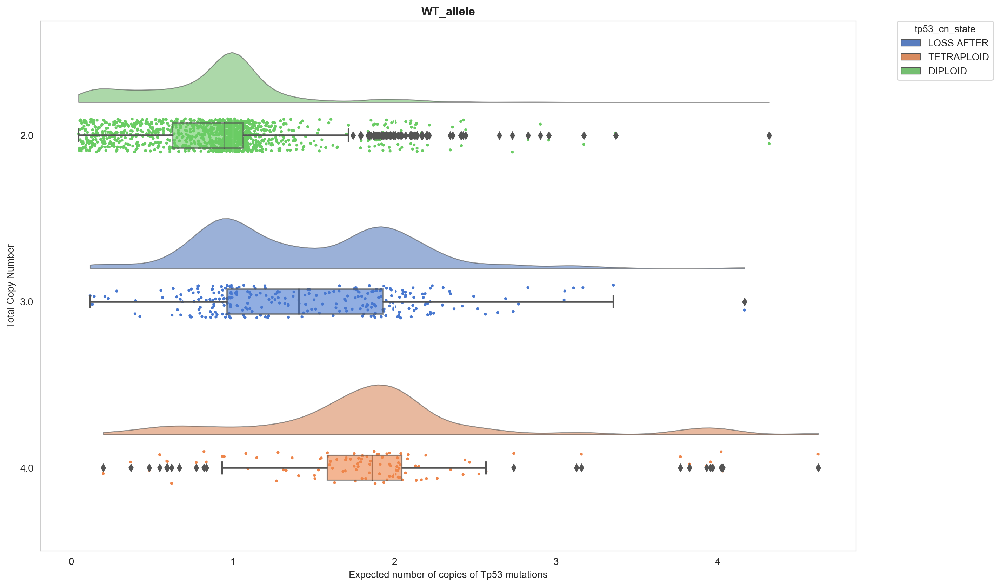

In [11]:
plot_summary(WT_allele,'WT_allele')

,count
tp53_cn_state,
HETLOSS,3382
LOSS BEFORE,2906
LOSS BEFORE & AFTER,200
,count
Cancer_Type,
Colorectal Cancer,1280
Non-Small Cell Lung Cancer,1002
Breast Cancer,923
Pancreatic Cancer,571


<Figure size 600x600 with 0 Axes>

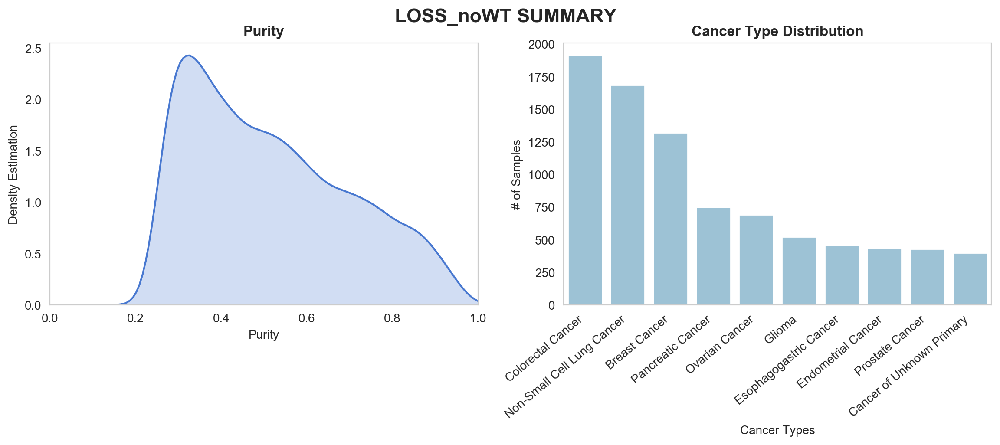

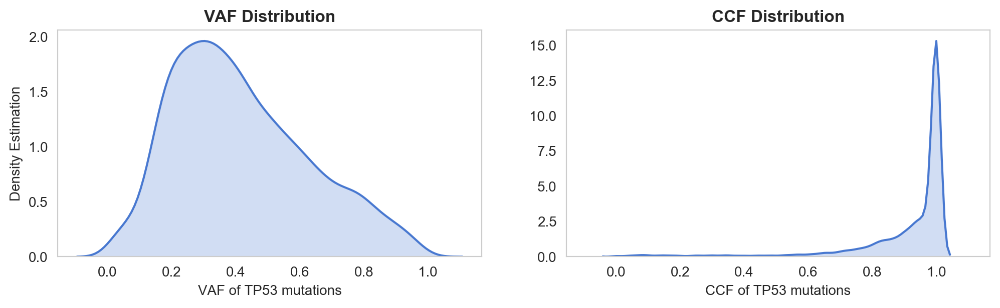

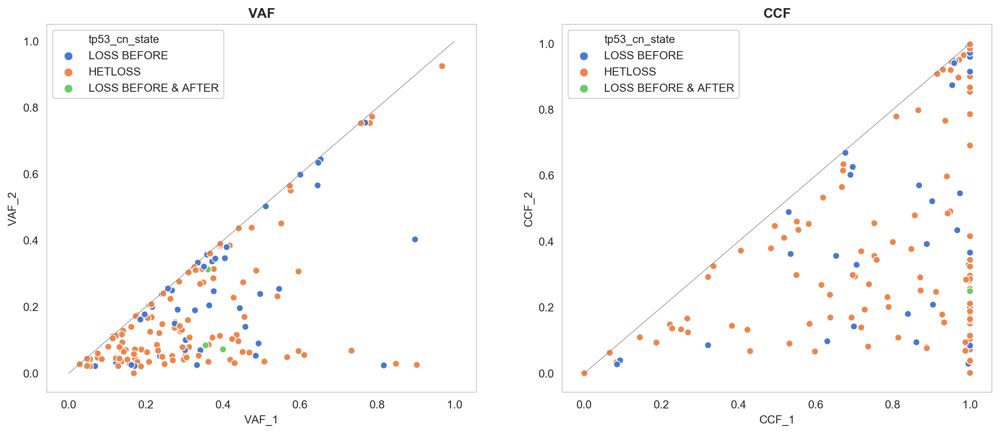

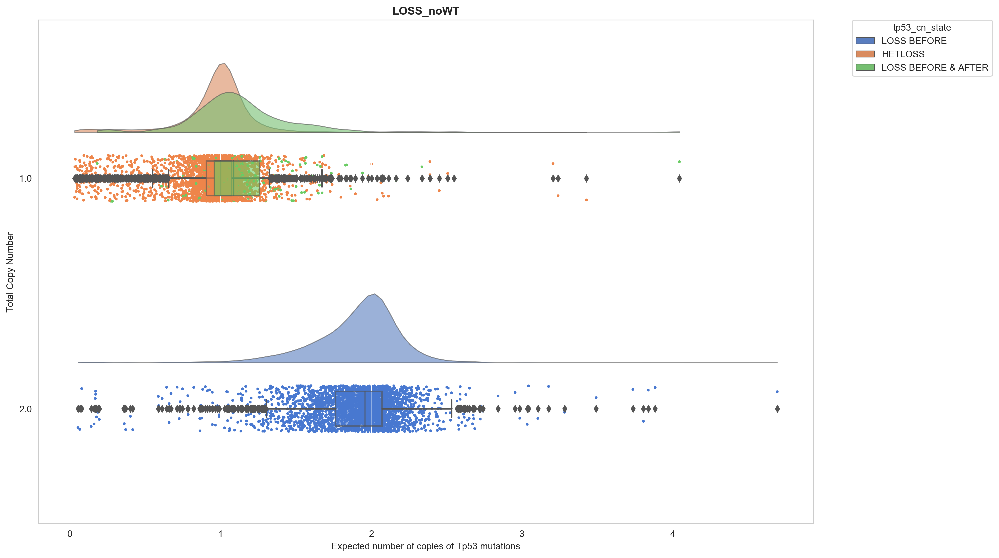

In [12]:
plot_summary(LOSS_noWT,'LOSS_noWT')

In [13]:
plot_summary(LOH,'LOH_noWT')

NameError: name 'LOH' is not defined

,count
tp53_cn_state,
AMP,11
GAIN,92
LOSS & GAIN,9
,count
Cancer_Type,
Non-Small Cell Lung Cancer,21
Glioma,13
Bladder Cancer,9
Colorectal Cancer,8


<Figure size 600x600 with 0 Axes>

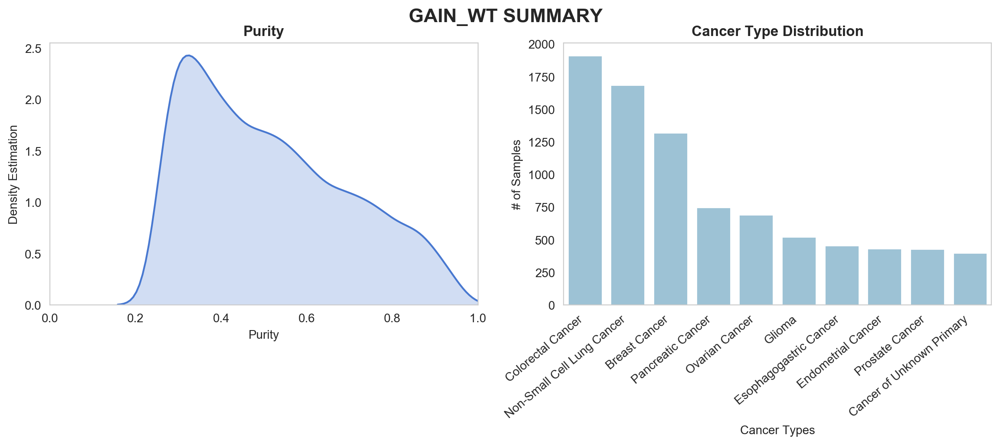

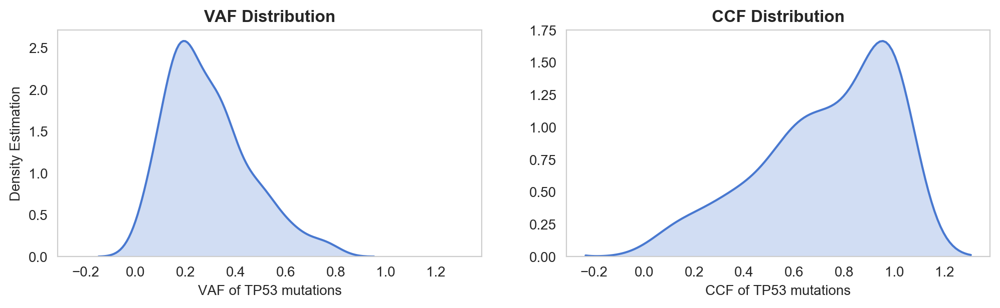

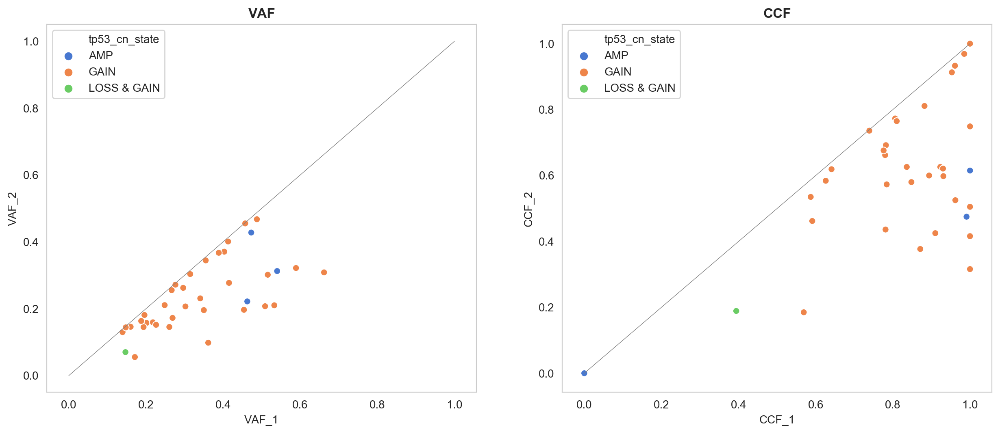

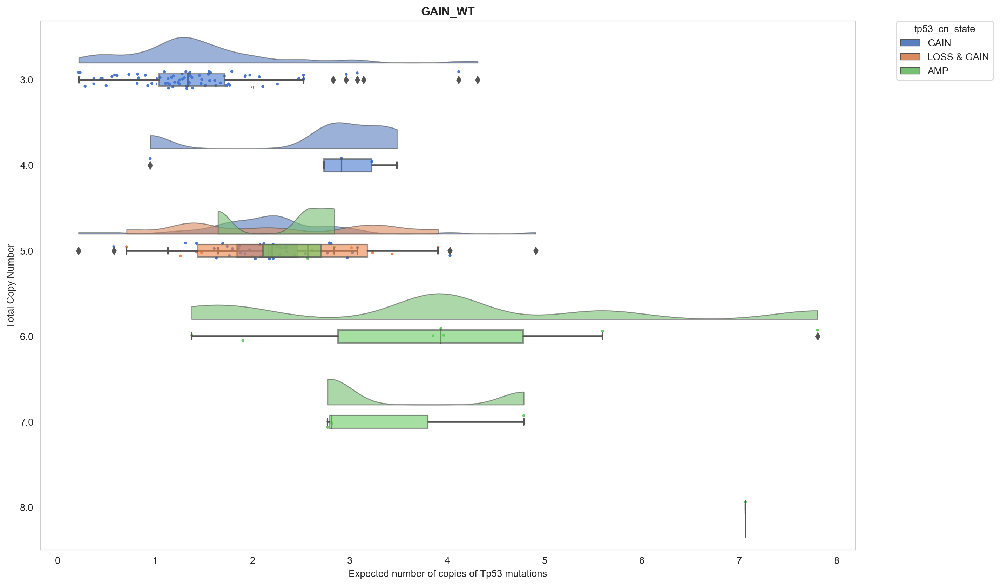

In [14]:
plot_summary(GAIN_WT,'GAIN_WT')

,count
tp53_cn_state,
CNLOH AFTER,29
DOUBLE LOSS AFTER,104
,count
Cancer_Type,
Colorectal Cancer,31
Non-Small Cell Lung Cancer,30
Bladder Cancer,11
Breast Cancer,10
Pancreatic Cancer,7


<Figure size 600x600 with 0 Axes>

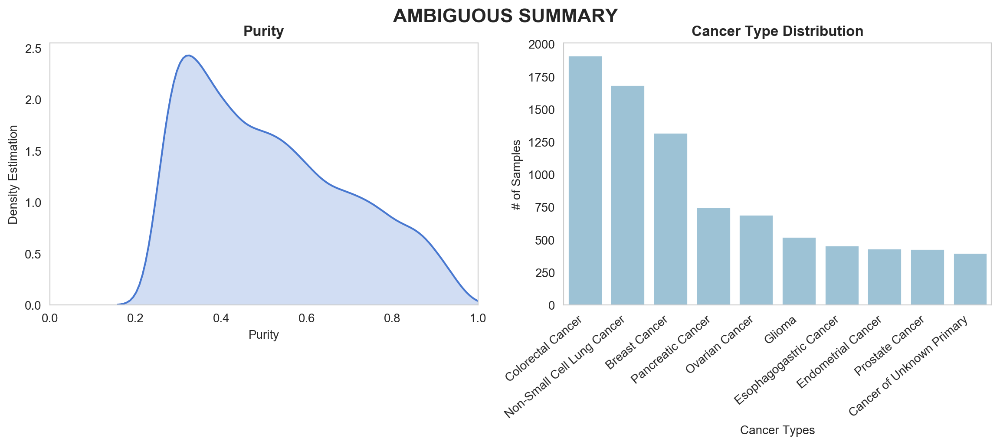

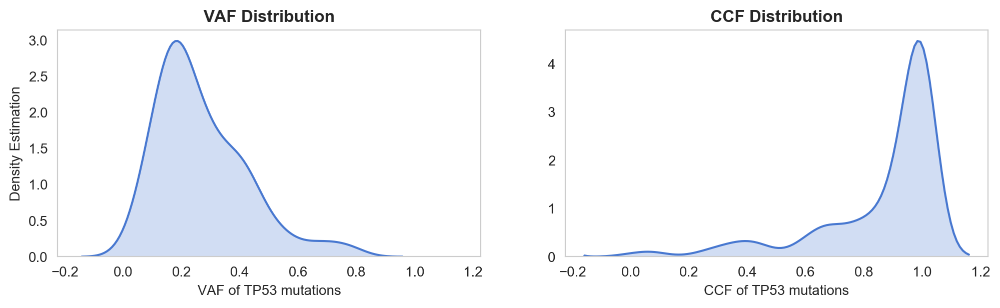

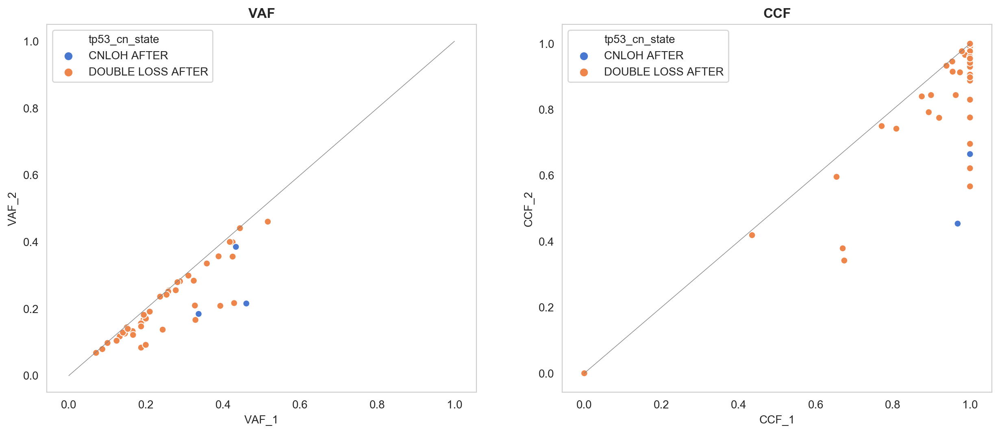

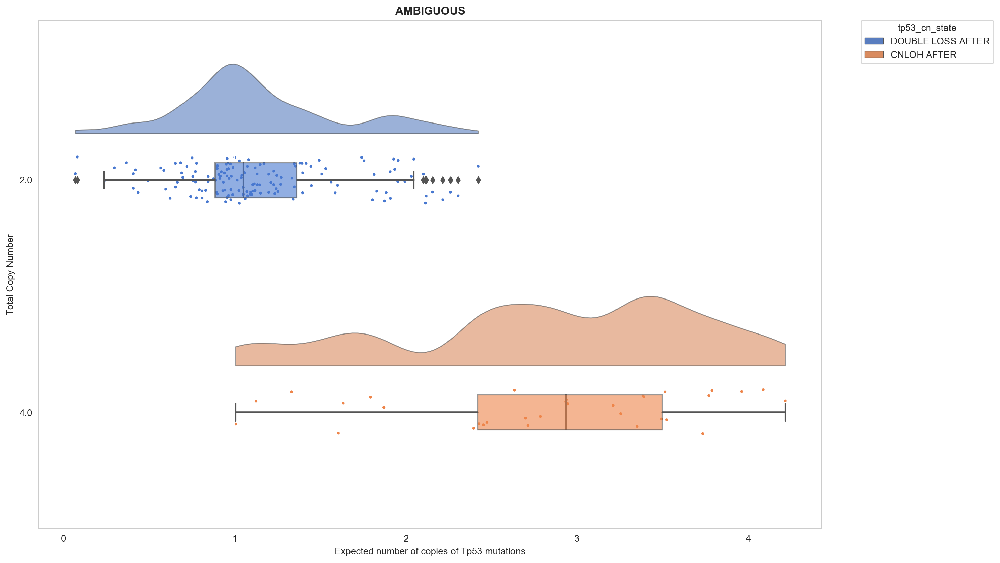

In [15]:
plot_summary(AMBIGUOUS,'AMBIGUOUS')

,count
tp53_cn_state,
AMP (BALANCED),7
AMP (LOH),6
HOMDEL,50
,count
Cancer_Type,
Non-Small Cell Lung Cancer,9
Colorectal Cancer,8
Breast Cancer,7
Prostate Cancer,7


<Figure size 600x600 with 0 Axes>

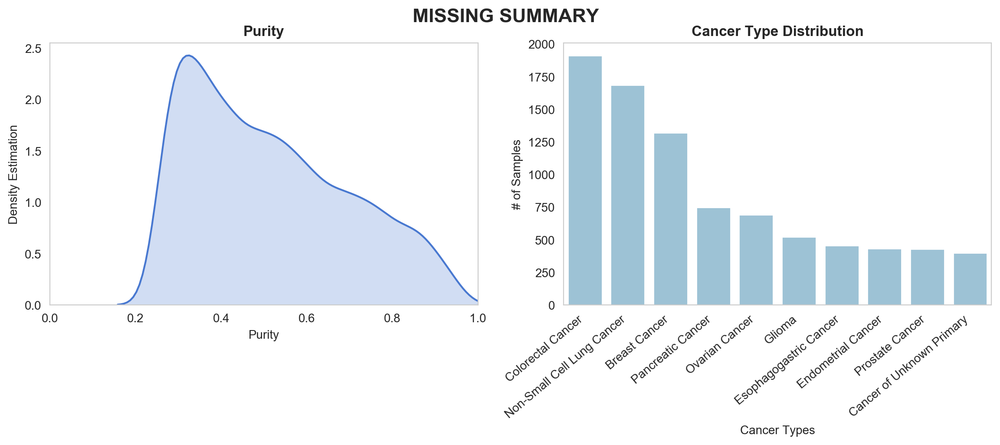

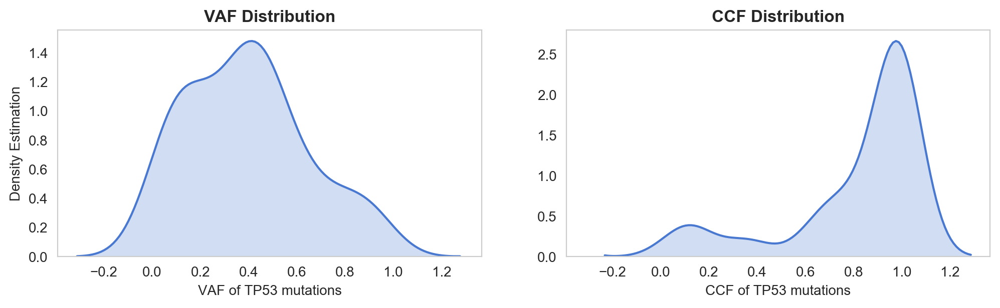

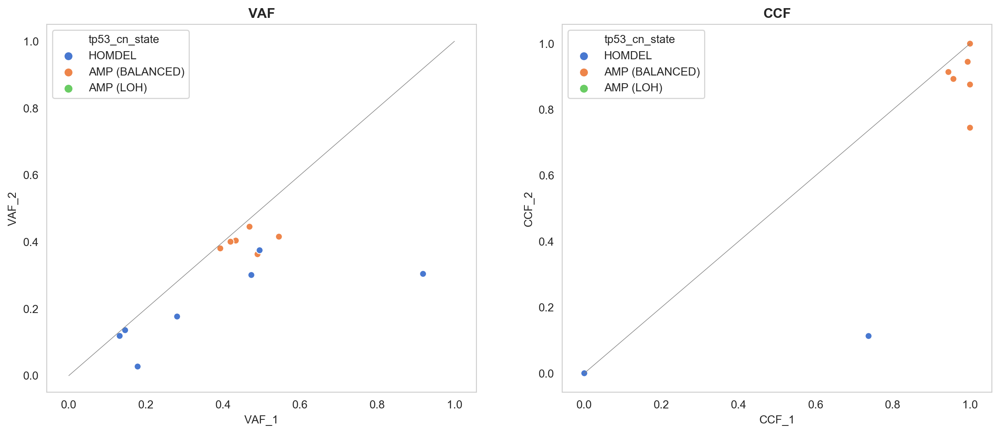

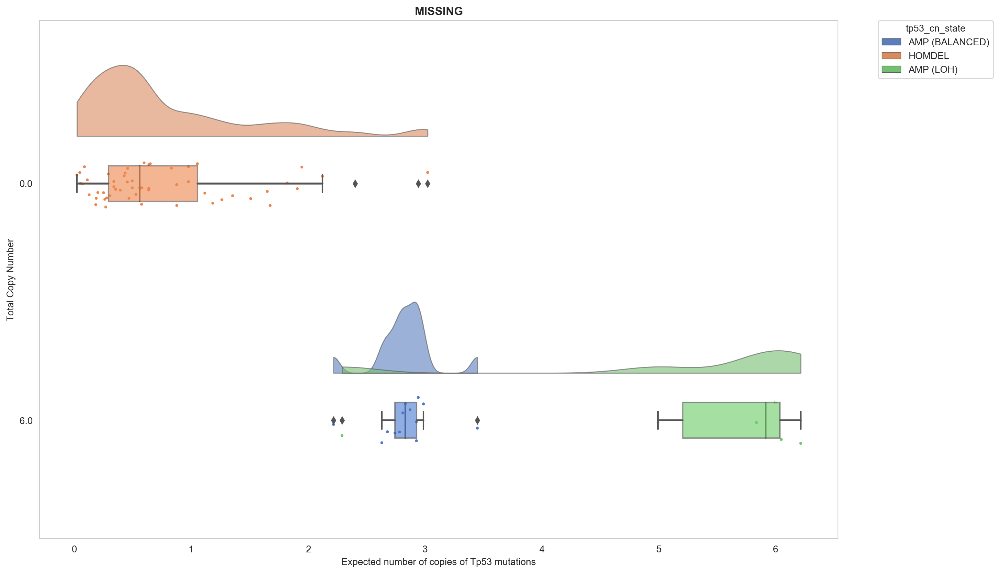

In [16]:
plot_summary(MISSING,'MISSING')

,count
tp53_cn_state,
INDETERMINATE,1082
,count
Cancer_Type,
Non-Small Cell Lung Cancer,183
Breast Cancer,130
Colorectal Cancer,126
Ovarian Cancer,103
Glioma,64
Pancreatic Cancer,56


<Figure size 600x600 with 0 Axes>

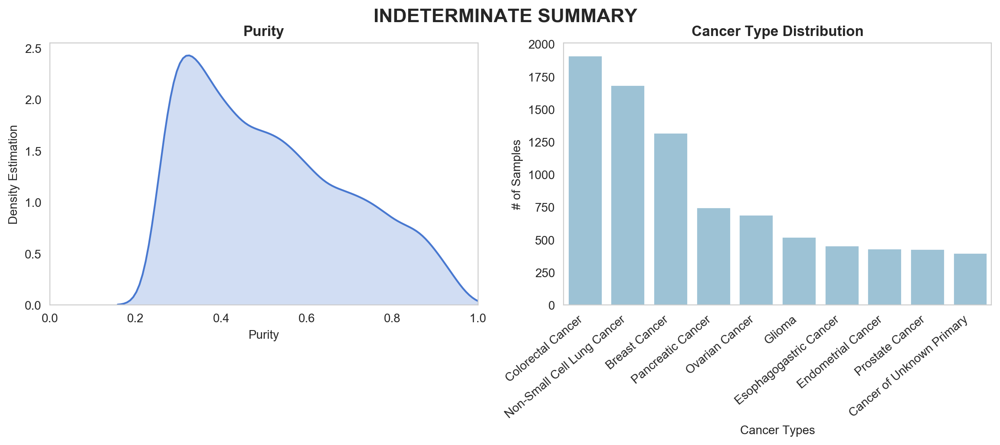

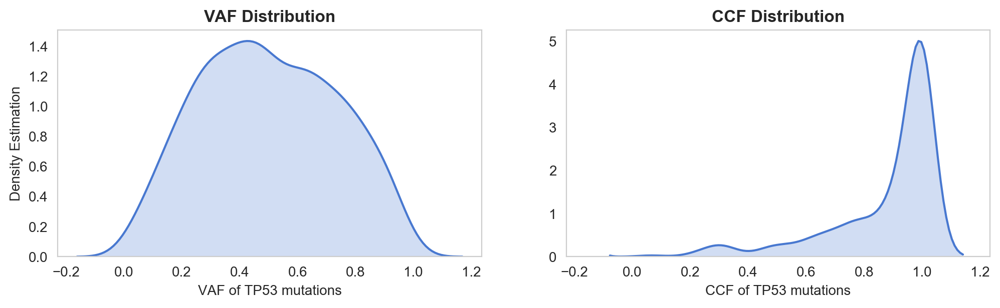

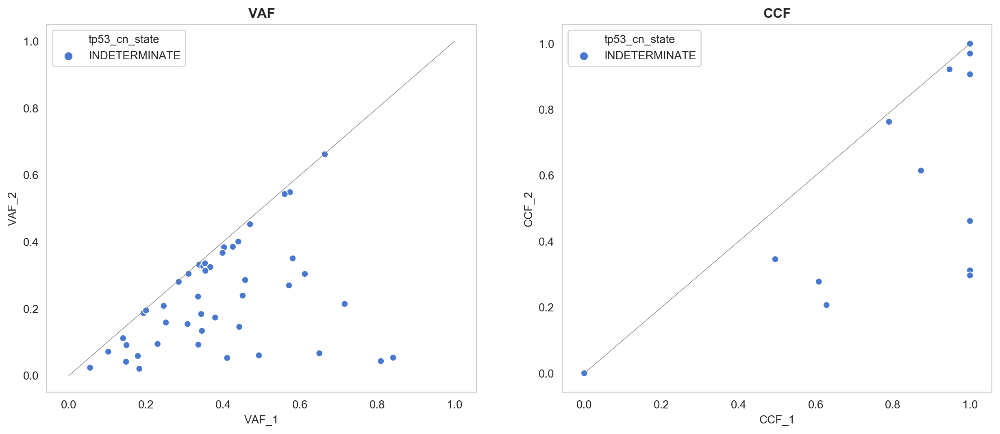

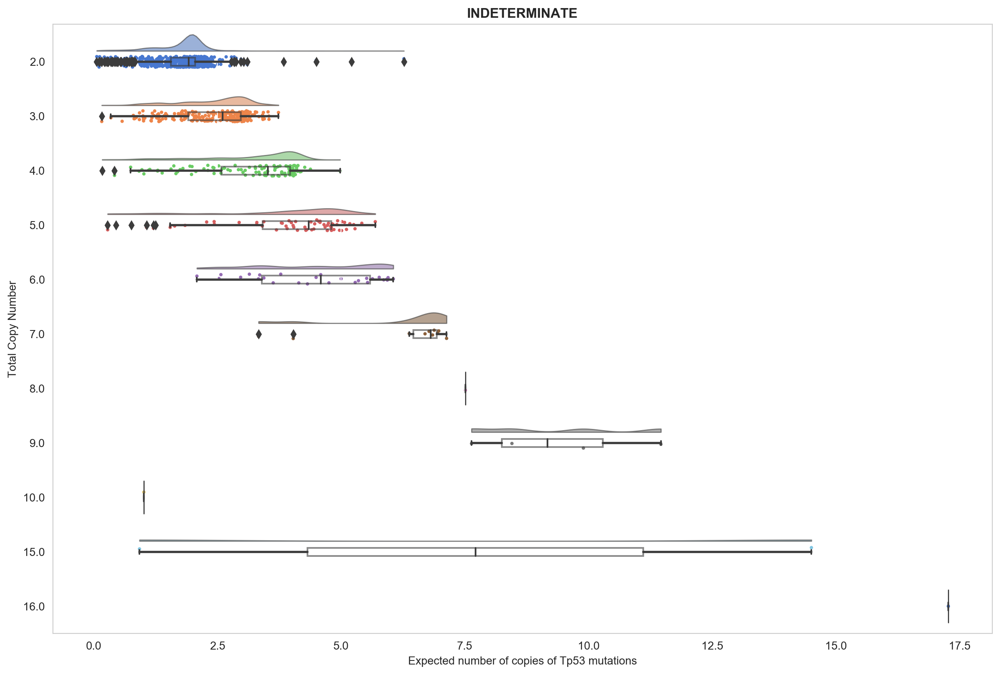

In [17]:
plot_summary(indeterminate, 'INDETERMINATE')

In [18]:
master_density = filter_cn_state(master, indeterminate)
master_density = filter_muts(master_density, [1])
master_density[master_density['tp53_tcn'] == 2]['tp53_exp_nb_1'].describe()

count    707.000000
mean       1.812508
std        0.631587
min        0.063210
25%        1.557537
50%        1.920110
75%        2.050181
max        9.654018
Name: tp53_exp_nb_1, dtype: float64

---
## Final Subgroups Analysis

First, we perform a general analysis on the subgroups without entering the metrics of each one. 
The first questions that have arisen are:
* How big are the subgroups?
* What percentage of the tp53 samples do they represent?
* What is the distribution of mutations within eah group?
* What is the distribution of sample types (Metastasis, Primary) within eah group?
* What are the main Cancers represented by group?


---
* **How big are the subgroups?** In comparison with the entire cohort, in comparison with tp53 positive samples

---
* **How big are the subgroups?** 
* **What is the distribution of mutations within eah group?**
* **What is the distribution of sample types (Metastasis, Primary) within eah group?**
* **What are the main Cancers represented by group?**


count 
 
 
 tp53_group 
 
 
 
 
 
 >=1_cnLOH 
 5114 
 
 
 >=1_LOSS 
 4000 
 
 
 0_HETLOSS 
 2751 
 
 
 1_WILD_TYPE 
 1734 
 
 
 >1muts 
 753 
 
 
 HOMDEL 
 281 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 tp53_count 
 
 
 
 
 
 0_HETLOSS 
 0 
 2751 
 
 
 1_WILD_TYPE 
 1 
 1734 
 
 
 >1muts 
 2 
 662 
 
 
 3 
 75 
 
 
 4 
 13 
 
 
 5 
 3 
 
 
 >=1_LOSS 
 1 
 3864 
 
 
 2 
 118 
 
 
 3 
 15 
 
 
 4 
 3 
 
 
 >=1_cnLOH 
 1 
 5022 
 
 
 2 
 84 
 
 
 3 
 7 
 
 
 5 
 1 
 
 
 HOMDEL 
 0 
 211 
 
 
 1 
 61 
 
 
 2 
 8 
 
 
 4 
 1 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 Sample_Type 
 
 
 
 
 
 0_HETLOSS 
 Metastasis 
 1228 
 
 
 Primary 
 1523 
 
 
 1_WILD_TYPE 
 Metastasis 
 587 
 
 
 Primary 
 1147 
 
 
 >1muts 
 Metastasis 
 240 
 
 
 Primary 
 513 
 
 
 >=1_LOSS 
 Metastasis 
 1691 
 
 
 Primary 
 2309 
 
 
 >=1_cnLOH 
 Metastasis 
 2419 
 
 
 Primary 
 2695 
 
 
 HOMDEL 
 Metastasis 
 107 
 
 
 Primary 
 174 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 Cancer_Type 
 
 
 
 
 
 0_HETLOSS 
 Breast Cancer 
 857 
 
 
 Non-Small Cell Lung Cancer 
 333 
 
 
 Prostate Cancer 
 227 
 
 
 1_WILD_TYPE 
 Non-Small Cell Lung Cancer 
 374 
 
 
 Colorectal Cancer 
 252 
 
 
 Pancreatic Cancer 
 153 
 
 
 >1muts 
 Colorectal Cancer 
 121 
 
 
 Non-Small Cell Lung Cancer 
 114 
 
 
 Glioma 
 108 
 
 
 >=1_LOSS 
 Colorectal Cancer 
 723 
 
 
 Breast Cancer 
 555 
 
 
 Non-Small Cell Lung Cancer 
 555 
 
 
 >=1_cnLOH 
 Non-Small Cell Lung Cancer 
 965 
 
 
 Colorectal Cancer 
 958 
 
 
 Breast Cancer 
 677 
 
 
 HOMDEL 
 Soft Tissue Sarcoma 
 43 
 
 
 Breast Cancer 
 33 
 
 
 Non-Small Cell Lung Cancer 
 30

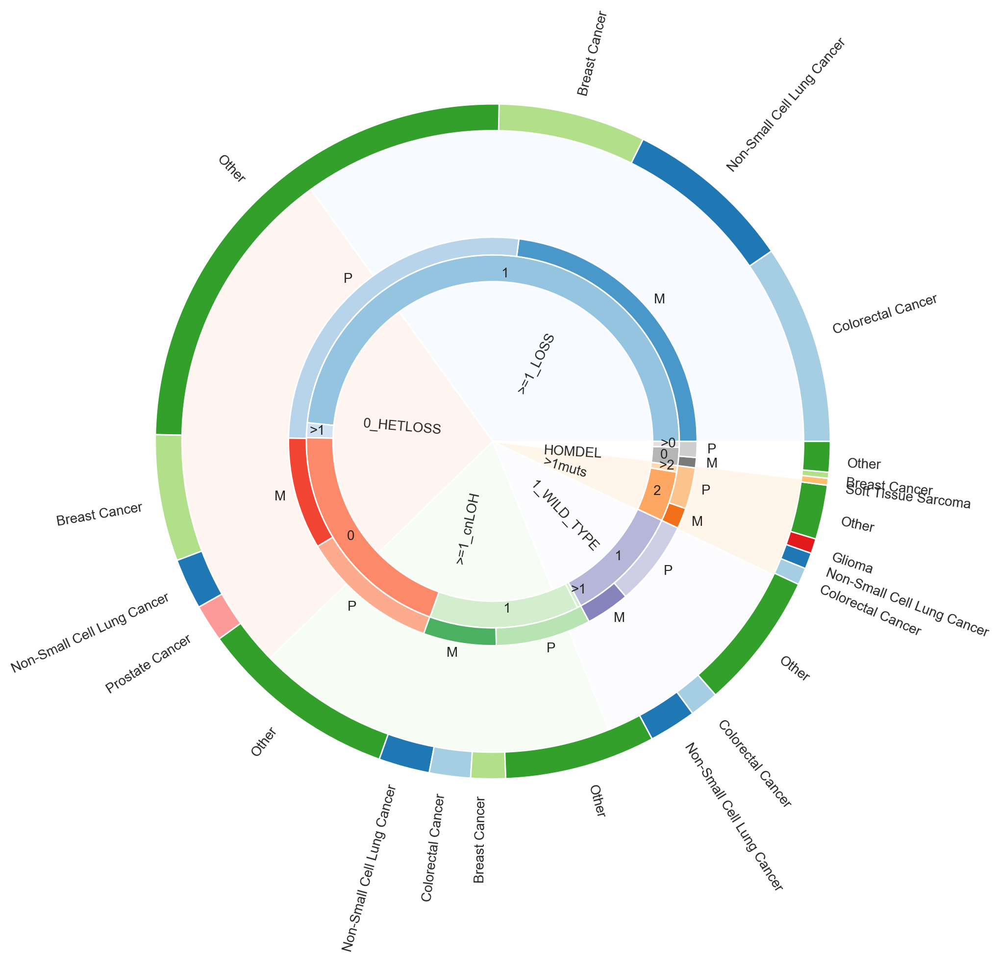

In [19]:
mut_tp53_count = pd.DataFrame(master[['tp53_group', 'tp53_count']].groupby(
    ['tp53_group', 'tp53_count'], sort=True).size())
mut_tp53_count.columns = ['count']

group_sample_count = pd.DataFrame(master[['tp53_group',
                                          'Sample_Type']].groupby(
                                              ['tp53_group', 'Sample_Type'],
                                              sort=True).size())
group_sample_count.columns = ['count']

# We select the 3 biggest cancers per subgroup.
cancers_per_group = pd.DataFrame(master[['tp53_group',
                                         'Cancer_Type']].groupby(
                                             ['tp53_group', 'Cancer_Type'],
                                             sort=True).size())
cancers_per_group.columns = ['count']
cancers_per_group = cancers_per_group['count'].groupby(level=0,
                                                       group_keys=False)
cancers_per_group = cancers_per_group.apply(
    lambda x: x.sort_values(ascending=False).head(3))

group_names = [
    '>=1_LOSS', '0_HETLOSS', '>=1_cnLOH', '1_WILD_TYPE', '>1muts', 'HOMDEL'
]
group_size = sorted(list(
    mut_tp53_count.groupby(['tp53_group']).sum()['count']),
                    reverse=True)

subgroup_size = [6904, 183, 2833, 1850, 45, 1457, 616, 81, 224, 72]
subgroup_names = [1, '>1', 0, 1, '>1', 1, 2, '>2', 0, '>0']

sample_size = [3271, 3816, 1260, 1556, 821, 1074, 494, 963, 232, 465, 116, 179]
sample_names = ['M', 'P', 'M', 'P', 'M', 'P', 'M', 'P', 'M', 'P', 'M', 'P']

cancer_size = [
    1361, 1158, 1005, 3563, 864, 347, 254, 1368, 348, 281, 237, 1029, 322, 198,
    937, 116, 110, 101, 370, 47, 41, 208
]

cancer_names = [
    'Colorectal Cancer', 'Non-Small Cell Lung Cancer', 'Breast Cancer',
    'Other', 'Breast Cancer', 'Non-Small Cell Lung Cancer', 'Prostate Cancer',
    'Other', 'Non-Small Cell Lung Cancer', 'Colorectal Cancer',
    'Breast Cancer', 'Other', 'Non-Small Cell Lung Cancer',
    'Colorectal Cancer', 'Other', 'Colorectal Cancer',
    'Non-Small Cell Lung Cancer', 'Glioma', 'Other', 'Soft Tissue Sarcoma',
    'Breast Cancer', 'Other'
]

group_count = get_groupby(master, 'tp53_group',
                          'count').sort_values(by='count', ascending=False)

display_side_by_side(group_count, mut_tp53_count, group_sample_count,
                     pd.DataFrame(cancers_per_group))

# Create colors
a, b, c, d, e, f, g = [
    plt.cm.Blues, plt.cm.Reds, plt.cm.Greens, plt.cm.Purples, plt.cm.Oranges,
    plt.cm.Greys, plt.cm.Paired
]

my_colors = [
    g(0),
    g(1),
    g(2),
    g(3),
    g(2),
    g(1),
    g(4),
    g(3),
    g(1),
    g(0),
    g(2),
    g(3),
    g(1),
    g(0),
    g(3),
    g(0),
    g(1),
    g(5),
    g(3),
    g(6),
    g(2),
    g(3)
]
# First Ring (outside)
fig, ax = plt.subplots()
ax.axis('equal')
mypie, _ = ax.pie(group_size,
                  radius=1.4,
                  colors=[a(0.6),
                          b(0.6),
                          c(0.6),
                          d(0.6),
                          e(0.6),
                          f(0.6)])
plt.setp(mypie, width=0.3, edgecolor='white')

mypie2, _ = ax.pie(group_size,
                   radius=1.9,
                   labels=group_names,
                   labeldistance=0.15,
                   rotatelabels=True,
                   colors=[a(0), b(0), c(0),
                           d(0), e(0), f(0)])
plt.setp(mypie2, width=1.9, edgecolor='white')
plt.margins(0, 0)

mypie2, _ = ax.pie(cancer_size,
                   radius=1.9,
                   labels=cancer_names,
                   labeldistance=1.05,
                   rotatelabels=True,
                   colors=my_colors)
plt.setp(mypie2, width=0.15, edgecolor='white')
plt.margins(0, 0)

# Second Ring (Inside)
mypie3, _ = ax.pie(subgroup_size,
                   radius=1.4 - 0.35,
                   labels=subgroup_names,
                   labeldistance=0.9,
                   colors=[
                       a(0.4),
                       a(0.2),
                       b(0.4),
                       c(0.2),
                       c(0.2),
                       d(0.4),
                       e(0.4),
                       e(0.2),
                       f(0.4),
                       f(0.2)
                   ])
plt.setp(mypie3, width=0.15, edgecolor='white')
plt.margins(0, 0)

# Third Ring (Middle)
mypie4, _ = ax.pie(sample_size,
                   radius=1.4 - 0.25,
                   labels=sample_names,
                   labeldistance=1.05,
                   colors=[
                       a(0.6),
                       a(0.3),
                       b(0.6),
                       b(0.3),
                       c(0.6),
                       c(0.3),
                       d(0.6),
                       d(0.3),
                       e(0.6),
                       e(0.3),
                       f(0.6),
                       f(0.3)
                   ])
plt.setp(mypie4, width=0.1, edgecolor='white')
plt.margins(0, 0)

#fig.savefig("tp53_subgroups.png", dpi=300, bbox_inches = 'tight')

We display it properly thanks to HTML tags

In [20]:
title = "tp53_subgroups"
html = prefix.replace('title', title)+mut_tp53_count.to_html()+suffix.replace('pic_file.png', title+".png")
IPython.display.display_html(html, raw=True)

<!DOCTYPE html>
 
 

 
 

 tp53_subgroups 

 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 tp53_count 
 
 
 
 
 
 0_HETLOSS 
 0 
 2751 
 
 
 1_WILD_TYPE 
 1 
 1734 
 
 
 >1muts 
 2 
 662 
 
 
 3 
 75 
 
 
 4 
 13 
 
 
 5 
 3 
 
 
 >=1_LOSS 
 1 
 3864 
 
 
 2 
 118 
 
 
 3 
 15 
 
 
 4 
 3 
 
 
 >=1_cnLOH 
 1 
 5022 
 
 
 2 
 84 
 
 
 3 
 7 
 
 
 5 
 1 
 
 
 HOMDEL 
 0 
 211 
 
 
 1 
 61 
 
 
 2 
 8 
 
 
 4 
 1

,count
tp53_group,
OTHER,14750
>=1_cnLOH,5114
>=1_LOSS,4000
0_HETLOSS,2751
1_WILD_TYPE,1734
>1muts,753
HOMDEL,281


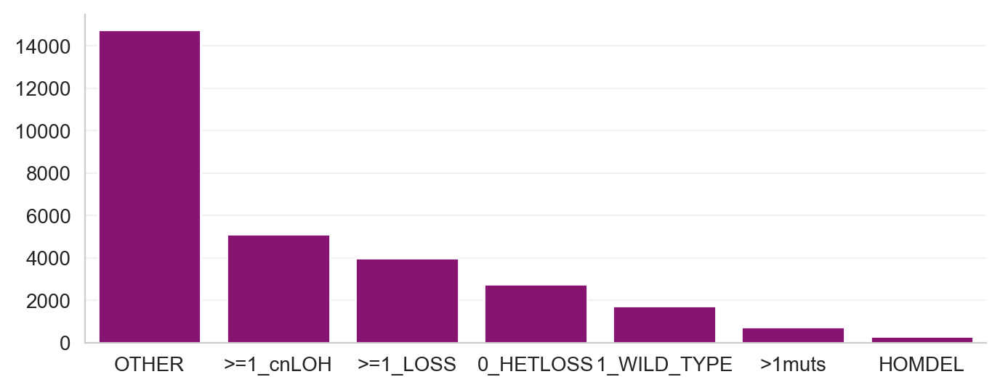

In [21]:
count = get_groupby(master, 'tp53_group', 'count')
count.loc['OTHER'] = [len(master) - int(get_groupby(master, 'tp53_group', 'count').sum())]
count = count.sort_values(by=['count'], ascending=False)
display(count)
get_ploth('count', count.index, count, '', '', '',color=plt.cm.RdPu(0.8), figsize=(8,3), perc=False)
plt.show()

---
* **What percentage of the tp53 samples do they represent?**

,count
tp53_group,
1_WILD_TYPE,1734
>1muts,753
>=1_LOSS,4000
>=1_cnLOH,5114
HOMDEL,70
OTHER,1582
0_HETLOSS,0
,%
tp53_group,


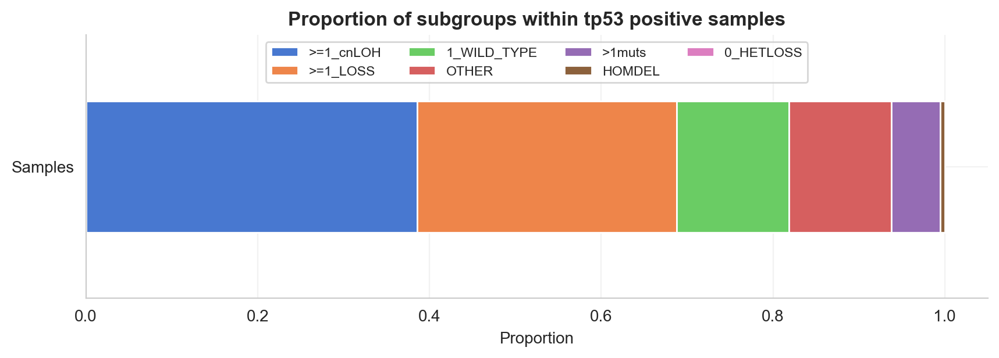

In [22]:
from itertools import cycle, islice

master_mult = filter_muts(master, [1,2,3,4,5])

# We verify that our notebooks 
assert( len(master_mult) == master_mult.tp53_group.isna().sum() + int(get_groupby(master_mult, 'tp53_group', 'count').sum()))

count = get_groupby(master_mult, 'tp53_group', 'count')
count.loc['OTHER'] = [len(master_mult) - int(get_groupby(master_mult, 'tp53_group', 'count').sum())]
count.loc['0_HETLOSS'] = [0]

freq = pd.DataFrame(count['count']).sort_values(by=['count'], ascending=False)/ pd.DataFrame(count['count']).sum()
freq.columns=['%']
display_side_by_side(count, round(100*freq,1))

#Plotting it
fig, ax = plt.subplots()
my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, len(count)))
freq.T.plot(kind = 'barh', stacked=True, figsize = (10,3), ax=ax, yticks=[], color=my_colors)
plt.title('Proportion of subgroups within tp53 positive samples', weight = 'bold')
plt.legend(loc = 'upper center', fontsize='small', ncol=4)
ax.yaxis.set_major_formatter(matplotlib.ticker.IndexFormatter(['Samples']))
ax.spines['right'].set_visible(False)
ax.set_xlabel('Proportion')
ax.spines['top'].set_visible(False)
plt.show()

---
What cn_state are present in the OTHER subgroup, and what is the number of people?

,count,%
tp53_cn_state,,
INDETERMINATE,1242,78.9
DOUBLE LOSS AFTER,110,7.0
GAIN,81,5.1
CNLOH & GAIN,61,3.9
CNLOH AFTER,42,2.7
AMP,15,1.0
LOSS & GAIN,11,0.7
AMP (BALANCED),7,0.4
AMP (LOH),6,0.4


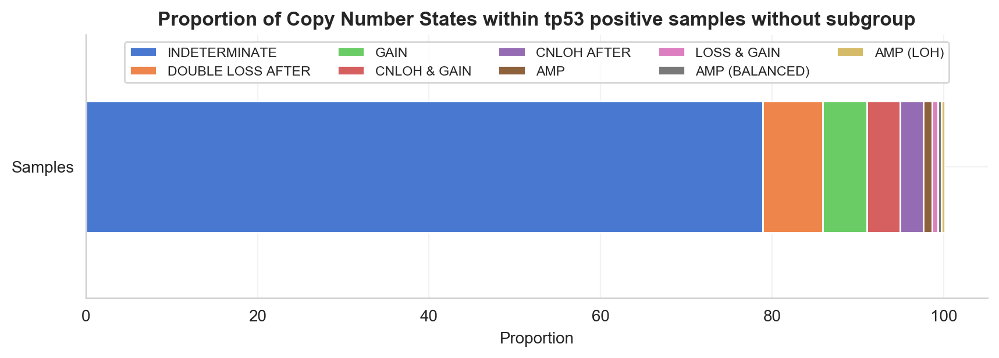

In [23]:
master_mult = filter_muts(master, [1,2,3,4,5])
master_mult = filter_general(master_mult, 'tp53_group',[None])
count = get_groupby(master_mult, 'tp53_cn_state', 'count').sort_values(by=['count'], ascending=False)
count['%'] = round(100*pd.DataFrame(count['count']).sort_values(by=['count'], ascending=False)/ pd.DataFrame(count['count']).sum(),1)
#freq.columns = ['%']
display(count)

#Plotting it
fig, ax = plt.subplots()
my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, len(count)))
count[['%']].T.plot(kind = 'barh', stacked=True, figsize = (10,3), ax=ax, yticks=[], color=my_colors)
plt.title('Proportion of Copy Number States within tp53 positive samples without subgroup', weight = 'bold')
plt.legend(loc = 'upper center', fontsize='small', ncol=5)
ax.yaxis.set_major_formatter(matplotlib.ticker.IndexFormatter(['Samples']))
ax.spines['right'].set_visible(False)
ax.set_xlabel('Proportion')
ax.spines['top'].set_visible(False)
plt.show()


## Individual Group - TP53 State Description

The following plots describe the different subgroups we created.
* *nb_muts_density*: nb of tp53 mutations we select to plot the densities (vaf, ccf, purity)
* *nb_muts_scatter*: nb of tp53 mutations we select to plot the scatters (VAF1/VAF2 and CCF1/CCF2) (0 means no plot because no multiple mutations)
* *mut_cn_group*: condition parameter to plot (not important)

**NB**: For now, 0_HETLOSS does not have anything because the subgroup does not include any tp53 mutation, same for HOMDEL. Tomorrow (Wednesday) I will compute visual summaries for them.

,count
tp53_cn_state,
HETLOSS,3382
LOSS BEFORE & AFTER,200
,count
Cancer_Type,
Colorectal Cancer,674
Breast Cancer,511
Non-Small Cell Lung Cancer,452
Pancreatic Cancer,410
Prostate Cancer,220


<Figure size 600x600 with 0 Axes>

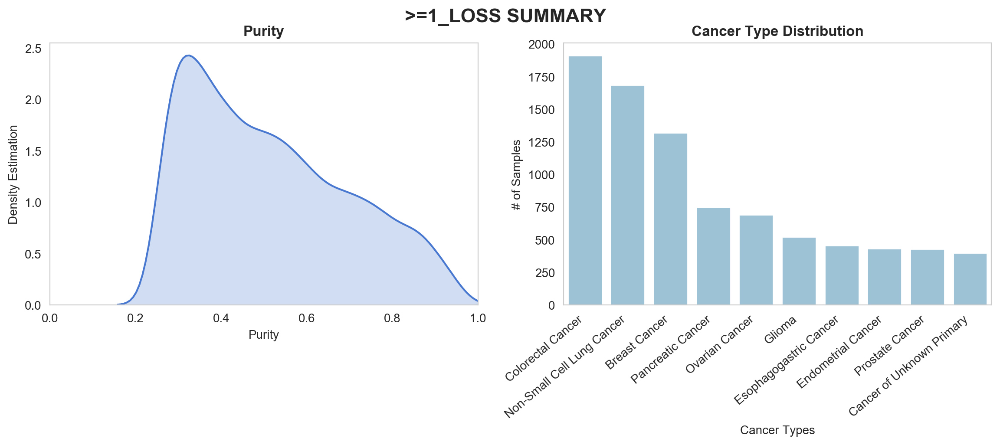

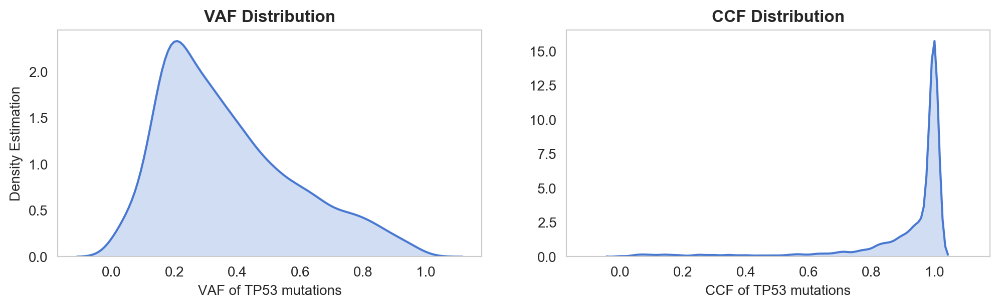

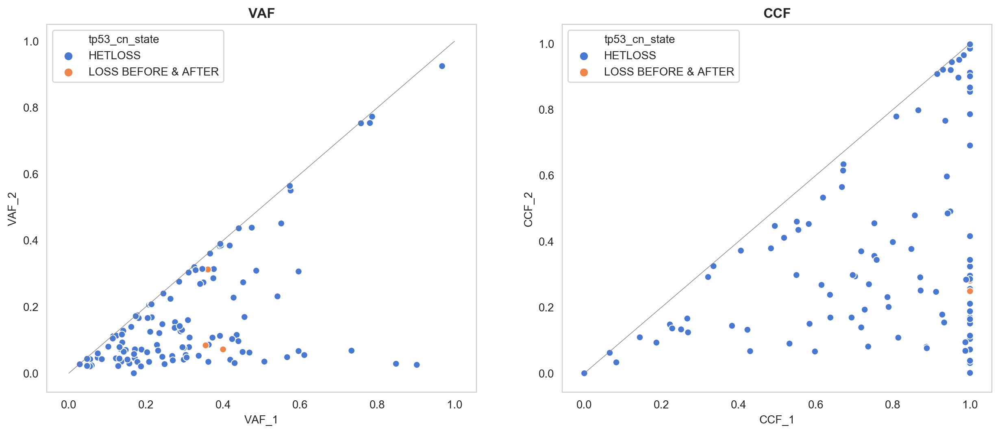

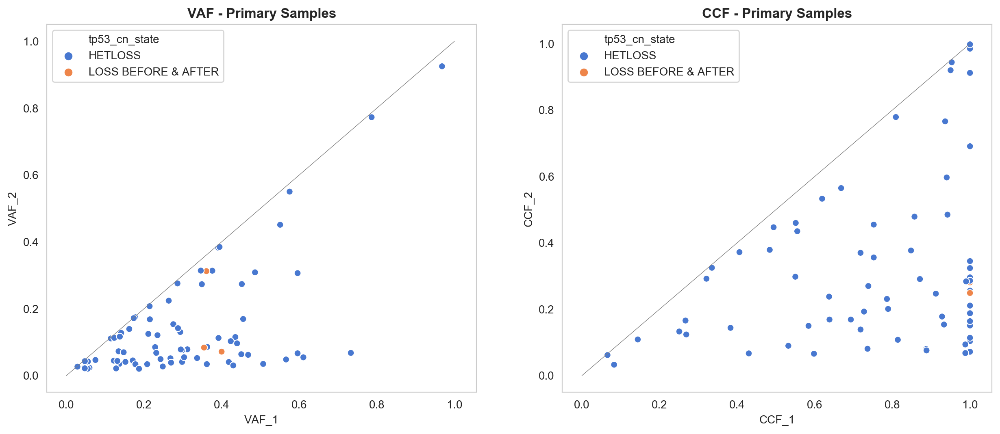

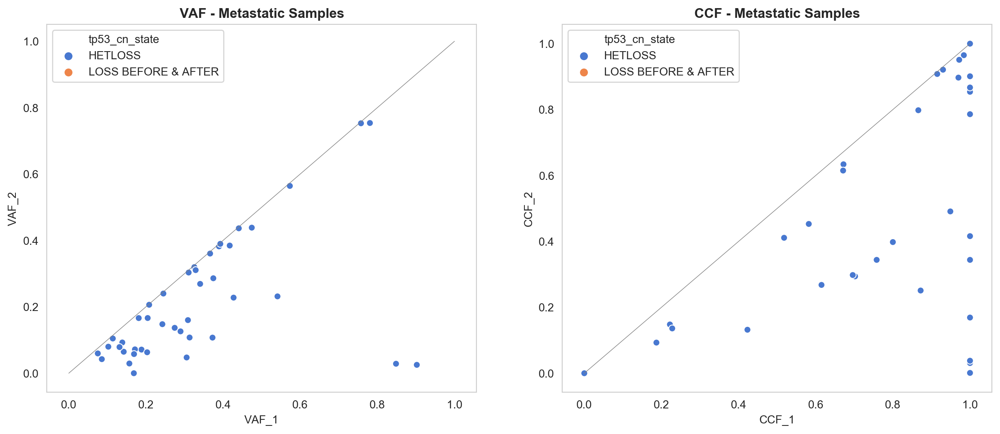

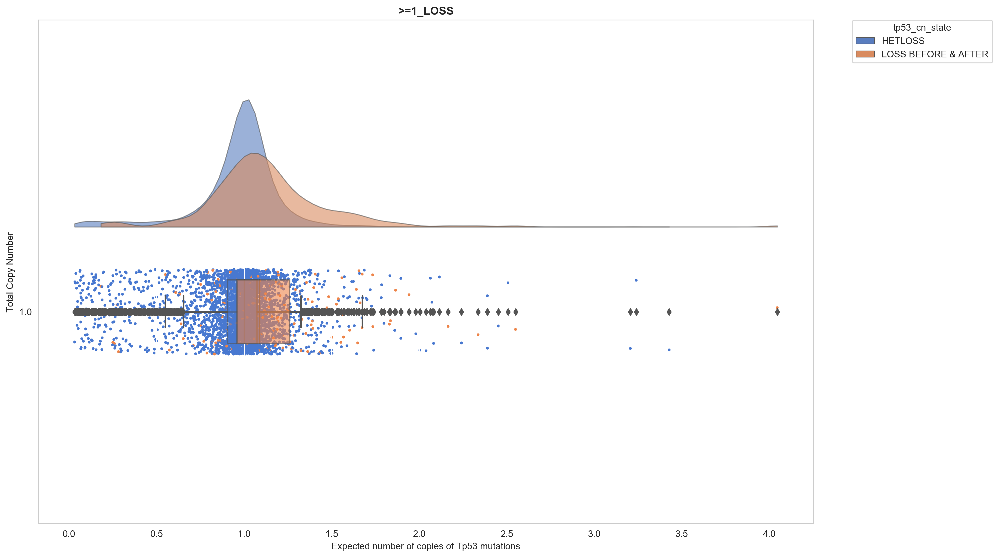

In [24]:
plot_summary(group=['>=1_LOSS'],group_name='>=1_LOSS',nb_muts_density=[1,2,3],nb_muts_scatter=[2,3], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
CNLOH,713
CNLOH BEFORE,160
CNLOH BEFORE & GAIN,26
CNLOH BEFORE & LOSS,835
LOSS BEFORE,2906
,count
Cancer_Type,
Colorectal Cancer,876
Non-Small Cell Lung Cancer,845


<Figure size 600x600 with 0 Axes>

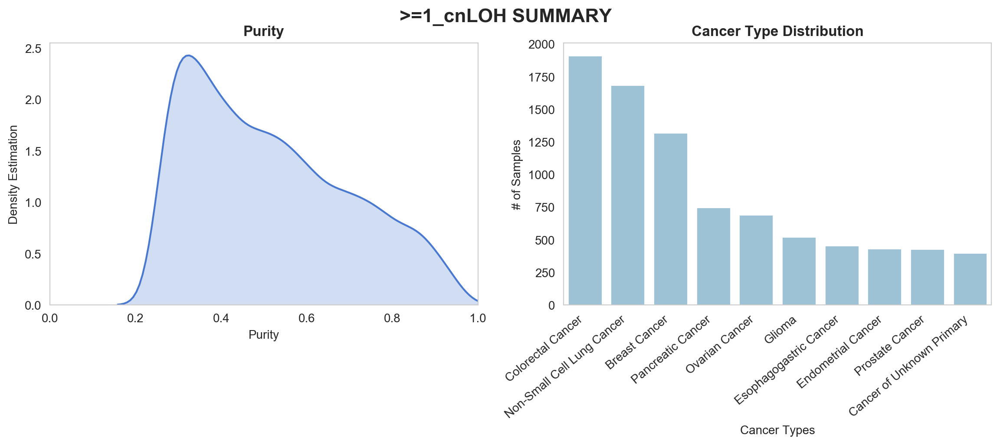

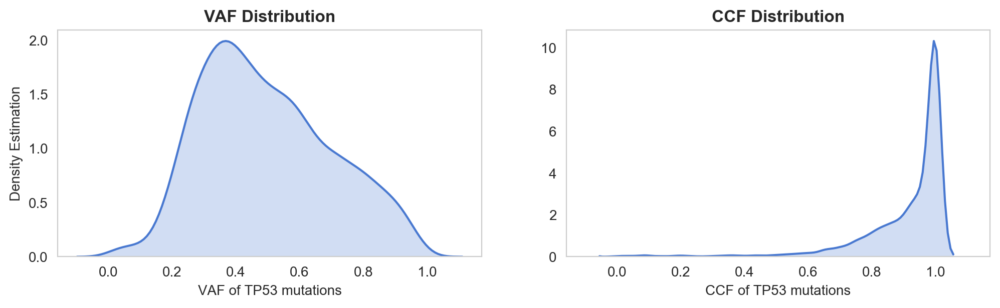

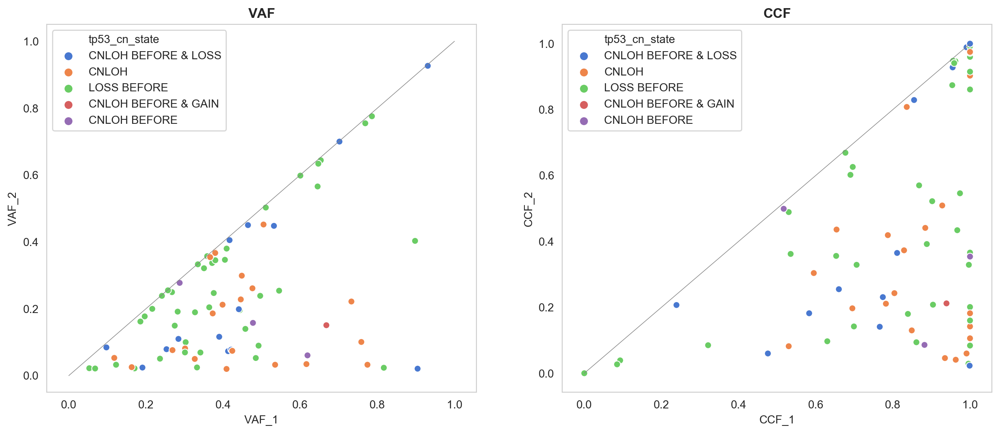

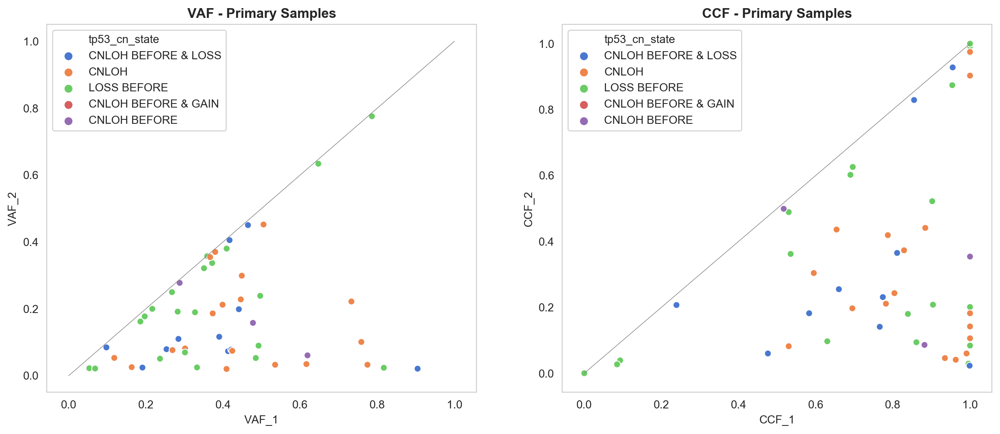

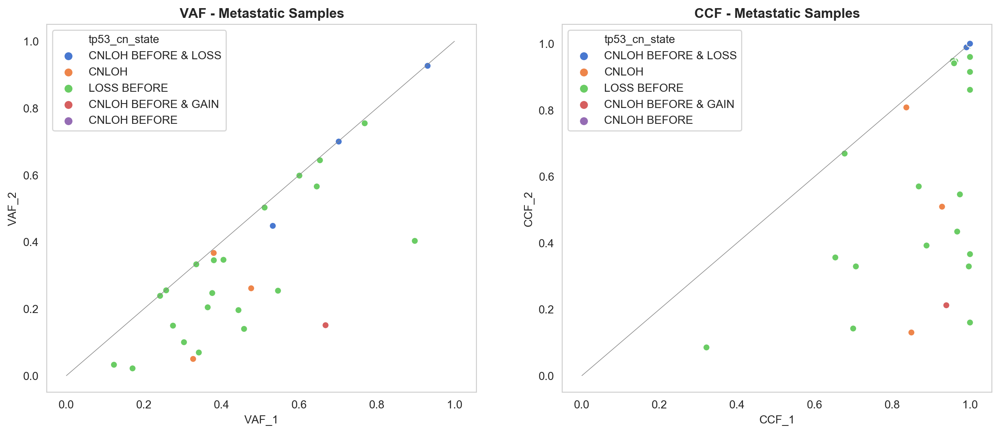

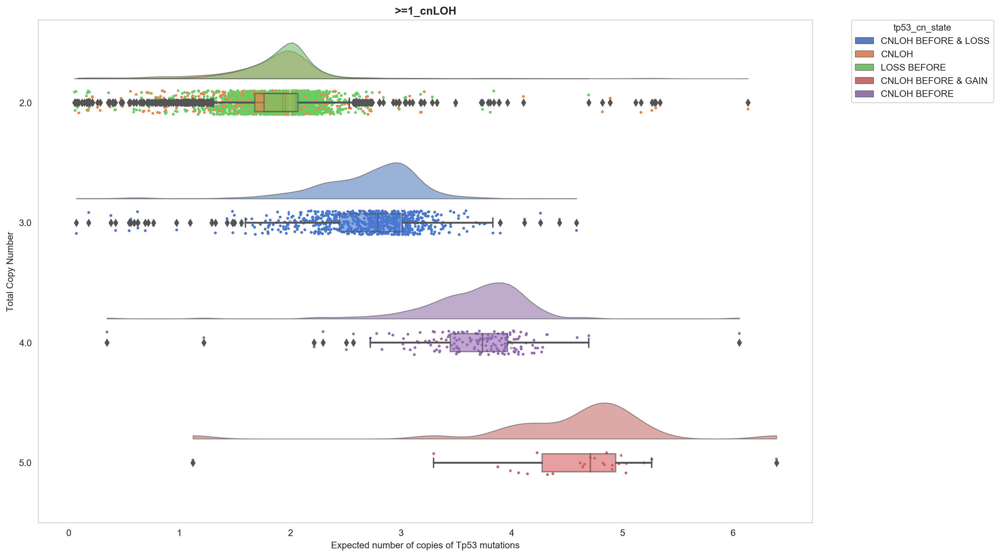

In [25]:
plot_summary(group=['>=1_cnLOH'],group_name='>=1_cnLOH',nb_muts_density=[1,2,3], nb_muts_scatter=[2,3], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
DIPLOID,523
LOSS AFTER,68
TETRAPLOID,22
,count
Cancer_Type,
Colorectal Cancer,96
Non-Small Cell Lung Cancer,85
Glioma,81
Endometrial Cancer,33


<Figure size 600x600 with 0 Axes>

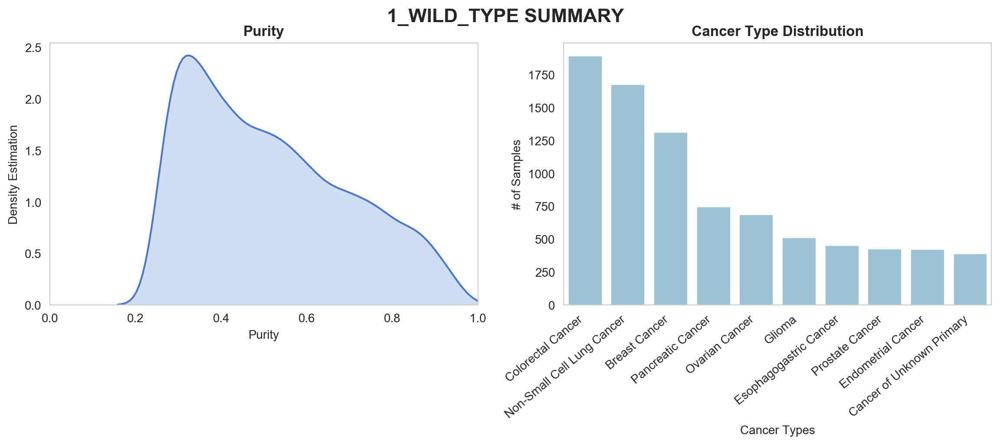

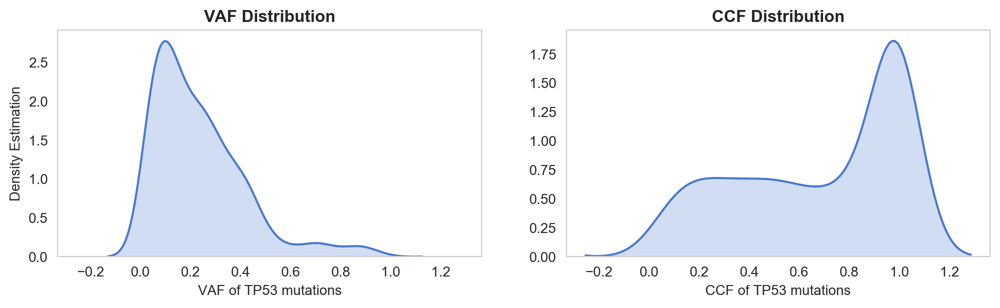

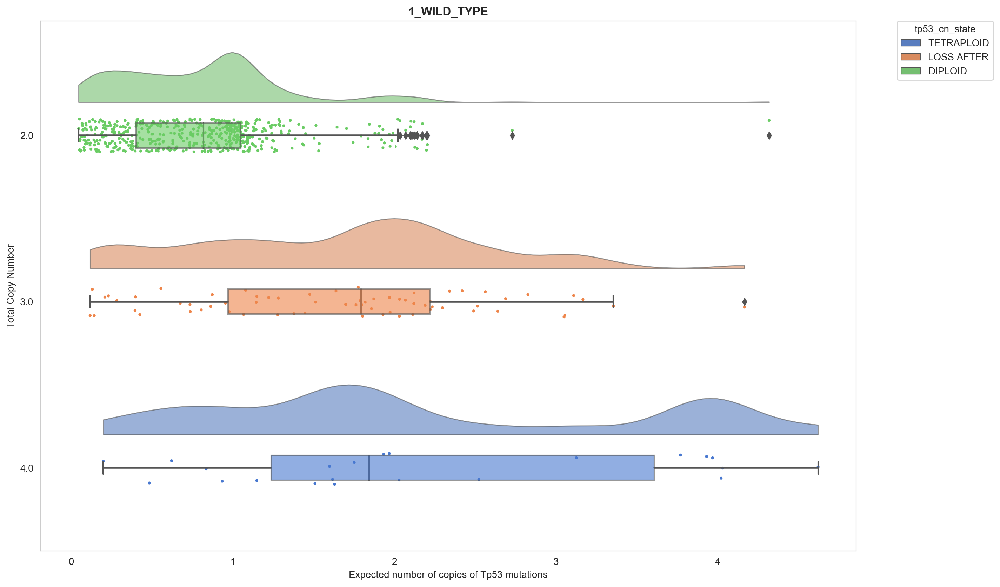

In [26]:
plot_summary(group=['1_WILD_TYPE'],group_name='1_WILD_TYPE',nb_muts_density=[1, 2],nb_muts_scatter=0, mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
DIPLOID,392
DOUBLE LOSS AFTER,40
GAIN,34
LOSS AFTER,104
TETRAPLOID,43
,count
Cancer_Type,
Glioma,101
Colorectal Cancer,97


<Figure size 600x600 with 0 Axes>

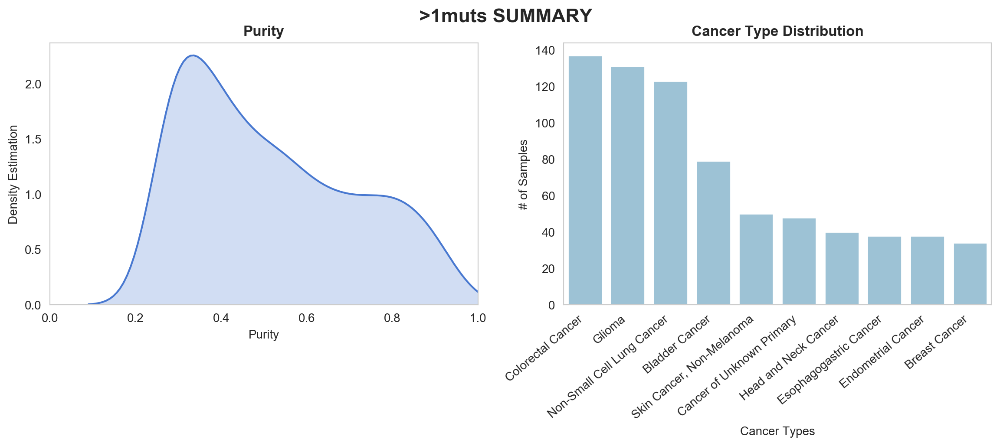

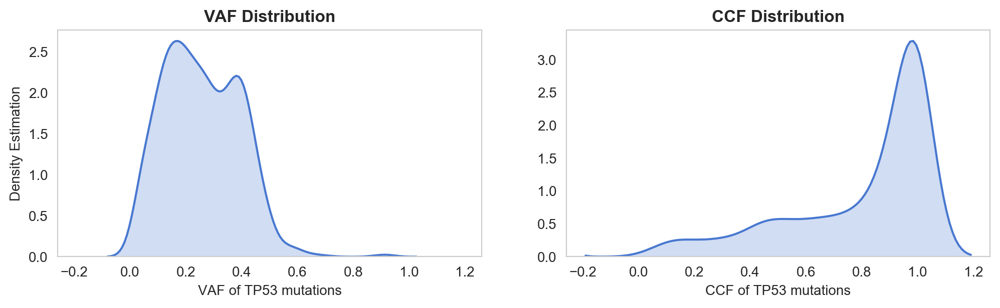

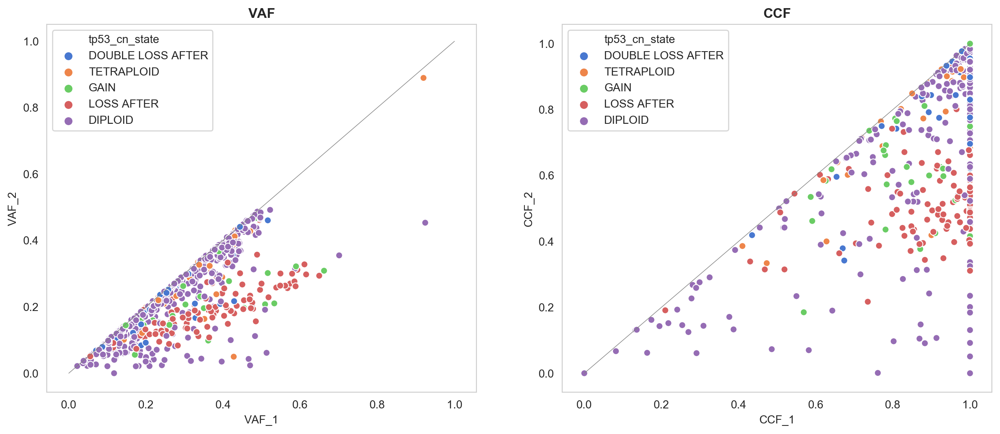

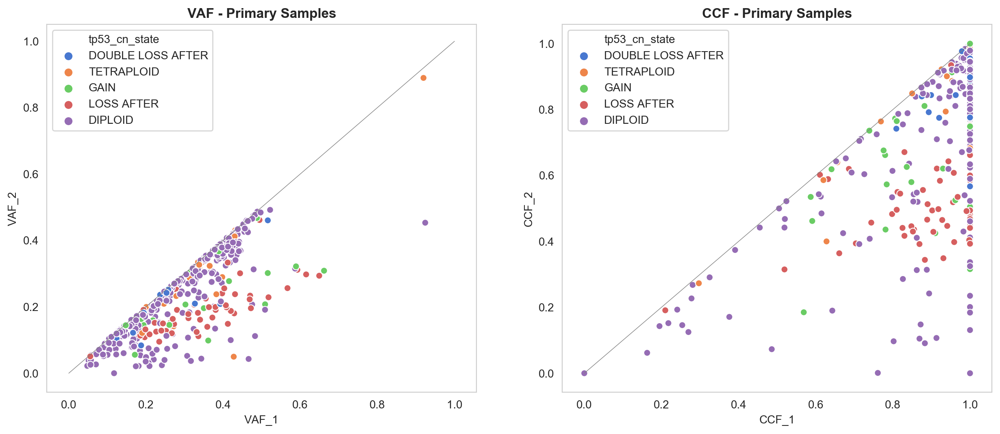

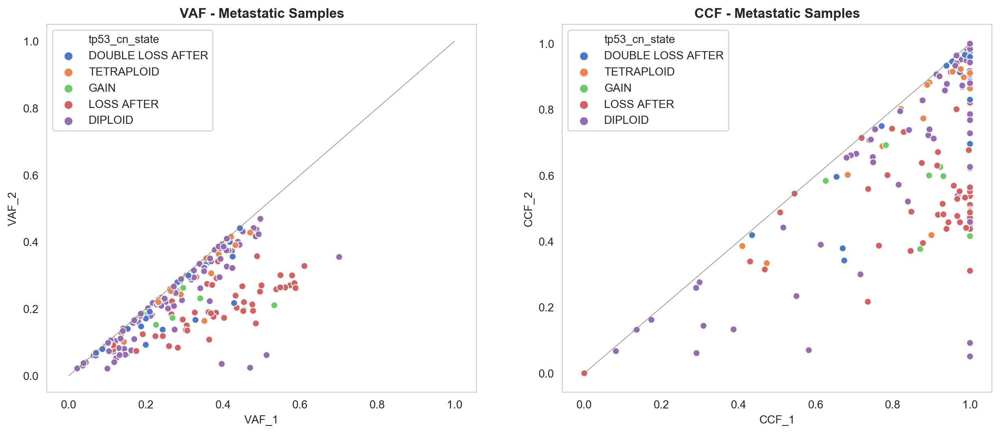

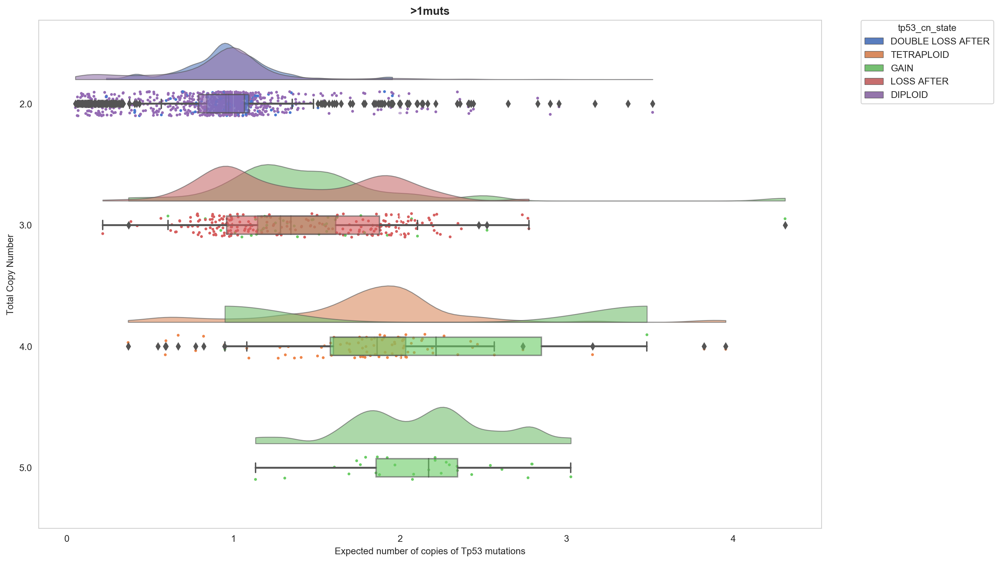

In [27]:
plot_summary(group=['>1muts'],group_name='>1muts',nb_muts_density=[2,3,4,5],nb_muts_scatter=[2,3,4,5], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
HOMDEL,51
,count
Cancer_Type,
Colorectal Cancer,9
Prostate Cancer,7
Breast Cancer,6
Non-Small Cell Lung Cancer,6
Ovarian Cancer,3
Soft Tissue Sarcoma,2


<Figure size 600x600 with 0 Axes>

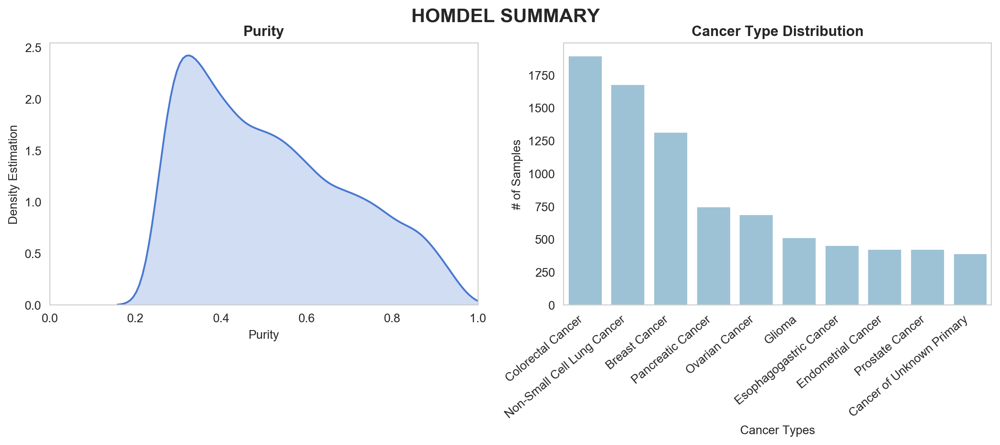

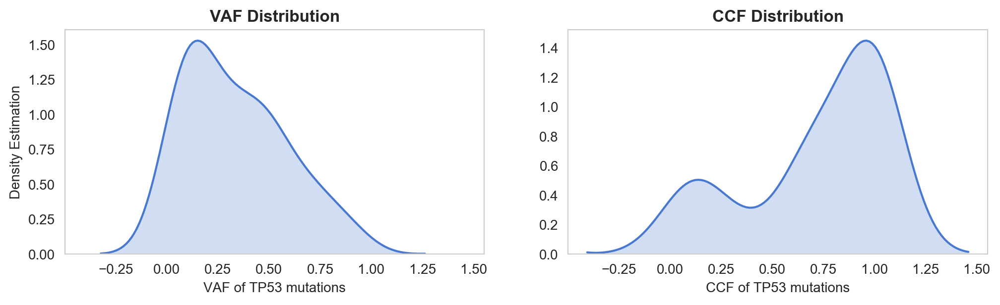

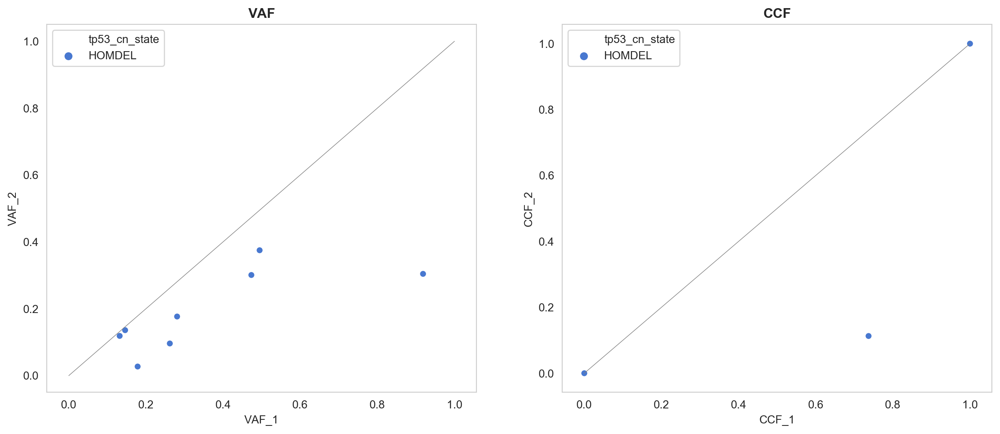

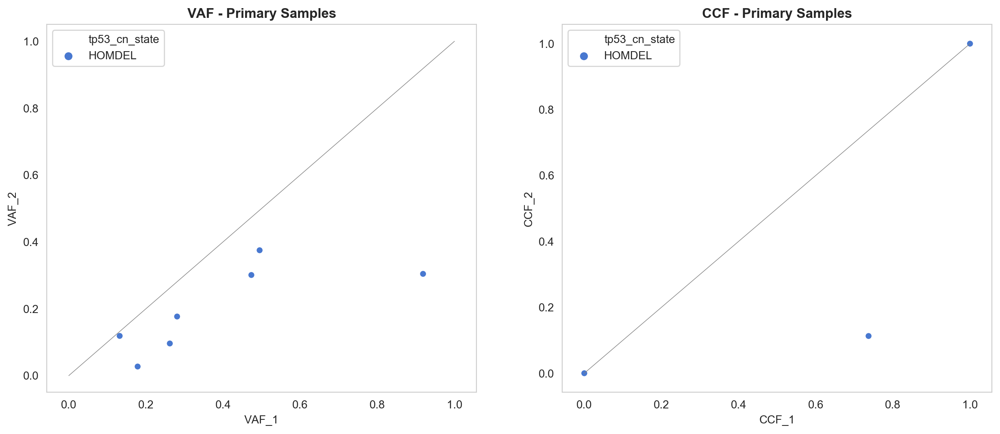

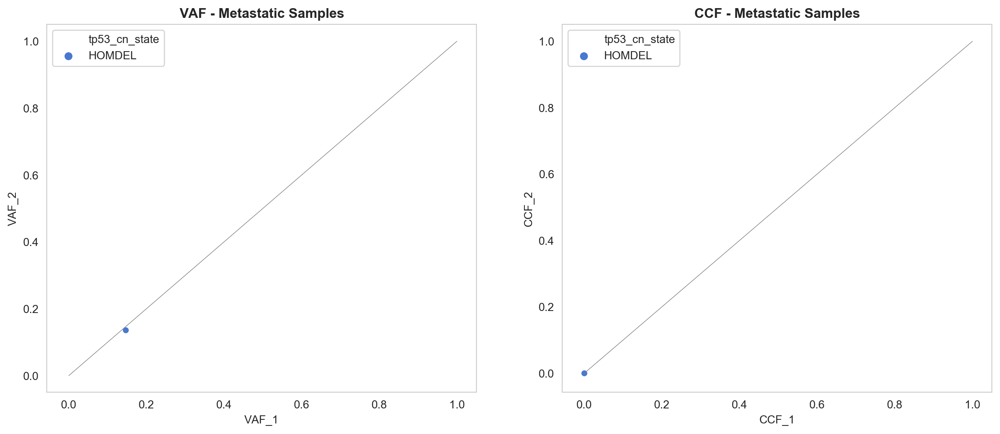

ValueError: There must be at least two hue levels to use `split`.'

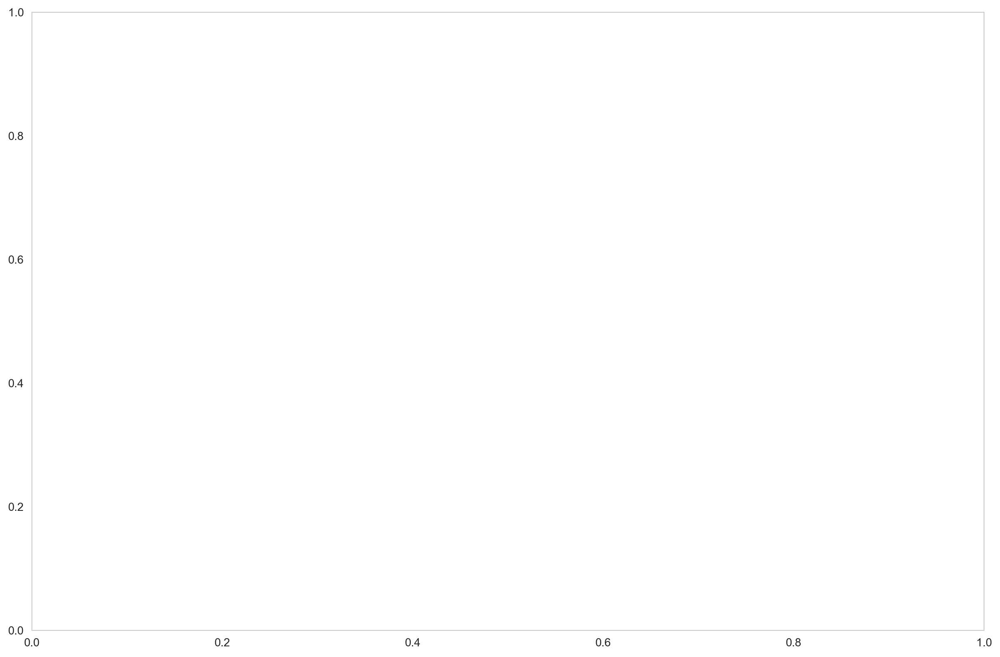

In [28]:
plot_summary(group=['HOMDEL'],group_name='HOMDEL',nb_muts_density=[1,2,4],nb_muts_scatter=[2,3,4,5], mut_cn_group=True, sample_type=True)

In [ ]:
master_demo = master[master['tp53_cn_state'] == 'CNLOH BEFORE & LOSS']
dx="tp53_tcn"; dy="tp53_exp_nb_1"; ort="h"; pal = "muted"; dhue = "tp53_cn_state"
f, ax = plt.subplots(figsize=(15, 10))

pt.RainCloud(x = dx, y = dy, data = master_demo, palette = pal,
                 width_viol = .6, ax = ax, orient = ort)

plt.title("CNLOH BEFORE & LOSS", weight='bold')
plt.ylabel('Total Copy Number')
plt.xlabel('Expected Number of TP53 mutant copies')

In [ ]:
h = pd.read_pickle(data_path + 'annotation/maf_cohort_annotated_80000_90000.pkl')

In [ ]:
h